In [445]:
!pwd

/mnt/BE2AE4662AE41CE1/projects/andrey/jn


In [446]:
?map

In [458]:
!nvitop --ascii               

Tue Nov 14 14:08:31 2023
+=============================================================================+
| NVIDIA-SMI 525.85.12       Driver Version: 525.85.12       CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------|
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:03:00.0  On |                  N/A |
|  0%   54C    P2   138W / 300W |   1821MiB / 11264MiB |     41%      Default |
+===============================+======================+======================+
[ CPU: |||||||| 23.9%                     ]  ( Load Average:  2.96  2.05  1.51 )
[ MEM: ||||| 16.0%                        ]  [ SWP: | 0.0%                     ]

+==============================================================================+
| Pro

In [45]:
import tqdm
import math
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

In [282]:
NJ_VALUE=2
NJ_COMMISSION=1.74

# Loading Ticks Data

In [44]:
df =pd.read_csv(
#                 './data/MNQ SEP23.Last-Minute.txt',
#                 './data/MNQ SEP23.Last-Ticks.txt', 
                '../data/MNQ DEC23.Last.txt',
                sep=';', 
                names=['date', 'last','bid','ask','vol'])
# df['date']=pd.to_datetime(df['date'])
df.head()

,date,last,bid,ask,vol
0,20231002 220000 0280000,14992.0,14992.0,14992.00,27
1,20231002 220000 0400000,14991.0,14991.0,14991.75,1
2,20231002 220000 0400000,14991.0,14991.0,14991.75,1
3,20231002 220000 0400000,14991.0,14991.0,14991.75,1
4,20231002 220000 0400000,14990.0,14990.0,14991.75,1


In [46]:
df.shape

(27483142, 5)

In [4]:
df['date'][0],df['date'][df.shape[0]-1],

('20231002 220000 0280000', '20231101 205959 9880000')

In [5]:
df.head(10)

,date,last,bid,ask,vol
0,20231002 220000 0280000,14992.00,14992.00,14992.00,27
1,20231002 220000 0400000,14991.00,14991.00,14991.75,1
2,20231002 220000 0400000,14991.00,14991.00,14991.75,1
3,20231002 220000 0400000,14991.00,14991.00,14991.75,1
4,20231002 220000 0400000,14990.00,14990.00,14991.75,1
5,20231002 220000 0400000,14990.00,14990.00,14991.75,1
6,20231002 220000 0400000,14990.00,14990.00,14991.75,1
7,20231002 220000 0400000,14990.00,14990.00,14991.75,1
8,20231002 220000 0400000,14990.00,14990.00,14991.75,1
9,20231002 220000 0400000,14989.25,14989.25,14991.75,1


In [6]:
df.tail()

,date,last,bid,ask,vol
27483137,20231101 205958 6280000,14760.00,14760.00,14761.0,1
27483138,20231101 205959 6720000,14760.75,14760.75,14761.0,1
27483139,20231101 205959 9480000,14760.75,14760.75,14761.0,1
27483140,20231101 205959 9880000,14760.25,14760.25,14761.0,1
27483141,20231101 205959 9880000,14760.25,14760.25,14761.0,1


## visual check

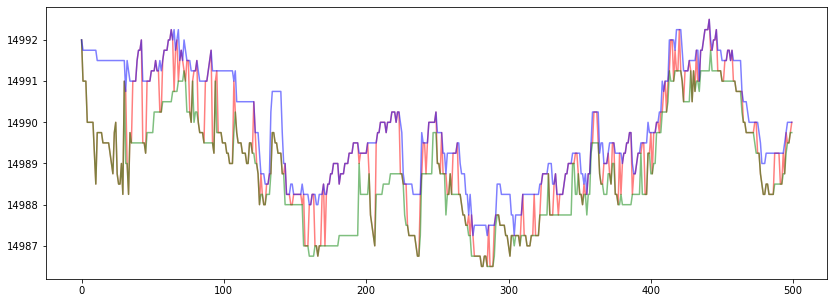

In [7]:
N=500
fig, ax1 = plt.subplots(figsize=(14,5))
ax1.plot(df.iloc[:N]['last'],color='red',alpha=0.5)
ax1.plot(df.iloc[:N]['bid'],color='green',alpha=0.5)
ax1.plot(df.iloc[:N]['ask'],color='blue',alpha=0.5)
plt.show()

In [8]:
# for row in df.iterrows():
for idx, row in df.iterrows():
    print(row['vol'])
    break

27


## convert ticks into volumes

In [9]:
?tqdm.tqdm

In [514]:
val = []
vol = 0
vol_limit = 500
data = []

for idx, row in tqdm.tqdm(df.iterrows(), total=df.shape[0]):
    if vol + row['vol'] == vol_limit:
        vol += row['vol']
        val.append(row['last'])
        data.append([row['date'], val[0],np.max(val), np.min(val),val[-1], vol])
        vol = 0
        val = []
        continue

    if (vol + row['vol'] > vol_limit):
        vol += row['vol']
        while vol > vol_limit:
            val.append(row['last'])
            data.append([row['date'], val[0],np.max(val), np.min(val),val[-1], vol_limit])
            vol -= vol_limit
            val = []
        continue
    vol += row['vol']
    val.append(row['deal'])
#     if idx > 100000:
#         break

100%|██████████| 27483142/27483142 [28:58<00:00, 15806.09it/s]


In [515]:
ddf = pd.DataFrame(data,columns=['date', 'open','high','low','close', 'vol'])
ddf['date'] = pd.to_datetime(ddf['date'].str[:-8])
ddf.head()

,date,open,high,low,close,vol
0,2023-10-02 22:00:38,14992.00,14992.25,14986.50,14989.50,500
1,2023-10-02 22:03:41,14989.75,14992.50,14988.25,14990.50,500
2,2023-10-02 22:08:04,14991.00,14992.75,14989.50,14992.00,500
3,2023-10-02 22:13:26,14992.00,14995.00,14987.75,14989.75,500
4,2023-10-02 22:14:44,14989.75,14999.00,14989.75,14997.50,500


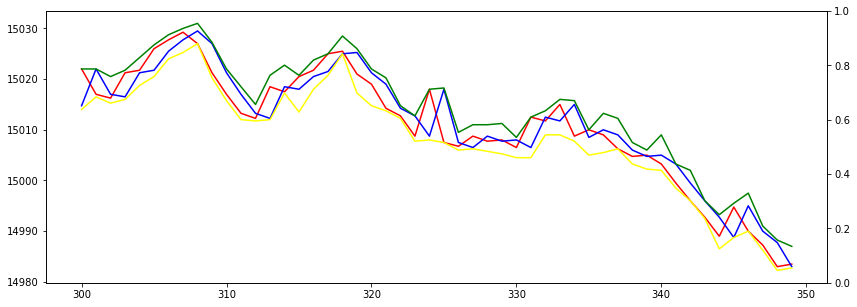

In [516]:
fig, ax1 = plt.subplots(figsize=(14,5))
I = 300
N = 50
ax1.plot( ddf.iloc[I:I+N]['close'], color='red')
ax1.plot( ddf.iloc[I:I+N]['open'], color='blue')
ax1.plot( ddf.iloc[I:I+N]['low'], color='yellow')
ax1.plot( ddf.iloc[I:I+N]['high'],color='green')
# ax1.plot(vals[I:I+N])
ax2 = ax1.twinx() 
# ax2.plot(lmax[:N], color='green')
# ax2.plot(actions[:N], color='green')
# ax1.plot(vals[I:I+N])
# ax2.plot(ddf.iloc[:N]['ft'], color='orange')
plt.show()

In [517]:
# simple check
ddf['vol'].min(), ddf['vol'].max(), ddf.shape

(500, 500, (61833, 6))

In [518]:
ddf['date'].min(),ddf['date'].max()

(Timestamp('2023-10-02 22:00:38'), Timestamp('2023-11-01 20:59:38'))

In [519]:
ddf.to_csv('../data/MNQ DEC23.Last-500-Volume.txt',index=None)


# Fisher Transformation

In [520]:

def fisher_transformation(df,
                          col='close',
                         period = 10):
    # data file should have one column with price data

    # col = 'close'
    period = 10
    fishPrev = 0
    tmpValuePrev = 0
    Value = []
    tmpSeries = []
    for i, v in enumerate(df[col]):
        if i > 0:
            fishPrev = Value[-1]
            tmpValuePrev =  tmpSeries[-1]

        min = df[col].iloc[i-period:i+1].min()
        max = df[col].iloc[i-period:i+1].max()
        if np.isnan(max):
            if i == 0:
                min = v
                max = v
            else:
                min = df[col].iloc[:i+1].min()
                max = df[col].iloc[:i+1].max()
        minLo = min
        num1 = max - minLo
        if num1<0.01:
            num1=0.025
        tmpValue = 0.66 * ((v - minLo)/num1 - 0.5) + 0.67 * tmpValuePrev
        if tmpValue > 0.99:
            tmpValue = 0.999
        elif tmpValue < -0.99:
            tmpValue = -0.99

        tmpSeries.append(tmpValue)
        val = 0.5 * math.log((1+tmpValue)/(1-tmpValue)) + 0.5* fishPrev
        Value.append(val)
    return Value
    #Value - contains final results

In [521]:
vals = fisher_transformation(ddf, 'close',10)
ddf['ft'] = vals
ddf.shape

(61833, 7)

In [12]:
# ddf.to_csv('../data/MNQ SEP23.Last-500-Volume.txt',index=None)
ddf.to_csv('../data/MNQ DEC23.Last-500-Volume.txt',index=None)


NameError: name 'ddf' is not defined

In [13]:
ddf = pd.read_csv('../data/MNQ DEC23.Last-500-Volume.txt')
ddf.head()

,date,open,high,low,close,vol,ft
0,2023-10-02 22:00:38,14992.00,14992.25,14986.50,14989.50,500,-0.342828
1,2023-10-02 22:03:41,14989.75,14992.50,14988.25,14990.50,500,-0.062081
2,2023-10-02 22:08:04,14991.00,14992.75,14989.50,14992.00,500,0.396141
3,2023-10-02 22:13:26,14992.00,14995.00,14987.75,14989.75,500,0.204056
4,2023-10-02 22:14:44,14989.75,14999.00,14989.75,14997.50,500,0.449363


In [14]:
!ls -fahl ../data

total 1.7G
drwxrwxrwx 1 root root 8.0K Nov  3 05:47  .
drwxrwxrwx 1 root root 4.0K Nov  3 10:12  ..
-rwxrwxrwx 1 root root 4.7K Apr 13  2023  fish20230411.txt
-rwxrwxrwx 1 root root 4.6M Nov  2 12:02 'MNQ DEC23.Last-500-Volume.txt'
-rwxrwxrwx 1 root root 1.4G Nov  2 11:17 'MNQ DEC23.Last.txt'
-rwxrwxrwx 1 root root 806K Oct 31 11:44 'MNQ SEP23.Last-500-Volume.txt'
-rwxrwxrwx 1 root root 357K Oct 30 09:43 'MNQ SEP23.Last-Minute.txt'
-rwxrwxrwx 1 root root 232M Oct 30 09:45 'MNQ SEP23.Last-Ticks.txt'
-rwxrwxrwx 2 root root  44M Apr 23  2023  MNQ500days1M20230422.txt
-rwxrwxrwx 2 root root  86M Apr 23  2023  MNQ500daysVolume50020230422.txt.txt
-rwxrwxrwx 2 root root 303K Apr 15  2023  NDX.X.csv
drwxrwxrwx 1 root root 8.0K Apr 16  2023  ninja-trade
-rwxrwxrwx 1 root root 516K Mar 23  2023  nq5years2h.csv
-rwxrwxrwx 1 root root  58K Apr  7  2023  nq_ext.csv


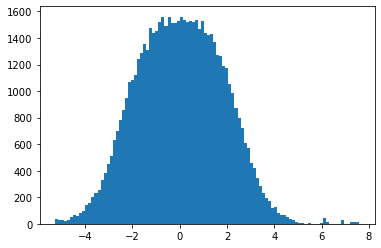

In [15]:
plt.hist(ddf['ft'], bins=100)
plt.show()

In [16]:
ddf['ft'].iloc[1:20]

1    -0.062081
2     0.396141
3     0.204056
4     0.449363
5     0.684623
6     1.064276
7     1.491839
8     1.929496
9     1.805566
10    1.371521
11    0.814375
12    0.299979
13   -0.062195
14   -0.541255
15   -1.037223
16   -1.162436
17   -1.235938
18   -1.374431
19   -1.679000
Name: ft, dtype: float64

# Fisher Local Maximum

In [17]:
def local_max(df, col):
    vals = [1,1]
    for x in tqdm.tqdm(range(df.shape[0]-2)):
        a,b = df[col].iloc[x:x+2]
        # print(a,b)
        if b>a:
            vals.append(1)
            if len(vals)>3:
                if (vals[-2]==-1) & (vals[-3]==1):
                    vals[-2]=1
        else:
            vals.append(-1)
            if len(vals)>3:
                if (vals[-2]==1) & (vals[-3]==-1):
                    vals[-2]=-1
    return vals

In [76]:
print(ddf.iloc[:100]['ft'].values)

[-0.34282825 -0.06208055  0.39614104  0.2040558   0.44936304  0.6846233
  1.06427606  1.49183911  1.92949641  1.80556587  1.37152126  0.81437529
  0.29997859 -0.06219484 -0.54125454 -1.03722254 -1.16243574 -1.2359381
 -1.37443108 -1.67899992 -2.00428447 -2.3829737  -2.64029192 -2.97820853
 -3.13741832 -2.3813932  -1.45044498 -0.6354149   0.09410418  0.72672482
  1.11754707  1.28441036  1.16525535  0.84578224  0.39723879 -0.08364095
 -0.61030737 -1.12419109 -1.61245369 -2.0766176  -2.52177493 -2.90688383
 -3.30577439 -3.70950244 -4.11429655 -4.51872748 -3.68008364 -2.72939813
 -2.23241892 -2.09822655 -1.691098   -1.08261276 -0.5872614  -0.23124116
  0.27482796  0.79847695  1.30269584  1.78142224  2.23794976  2.67748011
  3.10473892  3.52340964  3.93617585  3.5246772   3.24084716  3.00976927
  2.84150771  2.59655319  2.68978371  2.94674054  1.87074922  1.12466521
  0.83830947  0.5927656   0.5561865   0.11696823 -0.41006856 -0.93461625
 -1.41565204 -1.7850079  -1.51758333 -1.04728672 -0.5

In [80]:
# u = [1,2,3,4,5,4,3,2,1,0,1,2,3,4]
# uvals = []
# for x in tqdm.tqdm(range(len(u)-2)):
#     a,b = u[x],u[x+1]
#     # print(a,b)
#     if b>a:
#         uvals.append(1)
#     else:
#         uvals.append(-1)
# print(u)
# print(uvals)
# print(lmax[:100])

In [18]:
lmax = local_max(ddf, 'ft')

100%|██████████| 61831/61831 [00:02<00:00, 28088.32it/s]


In [19]:
assert len(lmax)== ddf.shape[0]
len(lmax), ddf.shape[0]

(61833, 61833)

# Create actions based on the Local Maximum

1 - buy
-1 sell

In [20]:
actions = [0]
for a,b in tqdm.tqdm(zip(lmax[:-1],lmax[1:])):
    if a!=b:
        actions.append(1 if b==1 else -1)
    else:
        actions.append(0)
len(actions)        

61832it [00:00, 2365505.59it/s]


61833

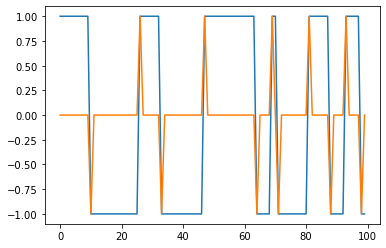

In [21]:
plt.plot(lmax[:100])
plt.plot(actions[:100])

In [22]:
ddf['action'] = actions

In [43]:
# ddf.to_csv('../data/MNQ SEP23.Last-500-Volume.txt',index=None)
ddf.to_csv('../data/MNQ DEC23.Last-500-Volume-Action.csv',index=None)


In [47]:
ddf = pd.read_csv('../data/MNQ DEC23.Last-500-Volume-Action.txt')
ddf.head()

,date,open,high,low,close,vol,ft,action
0,2023-10-02 22:00:38,14992.00,14992.25,14986.50,14989.50,500,-0.342828,0
1,2023-10-02 22:03:41,14989.75,14992.50,14988.25,14990.50,500,-0.062081,0
2,2023-10-02 22:08:04,14991.00,14992.75,14989.50,14992.00,500,0.396141,0
3,2023-10-02 22:13:26,14992.00,14995.00,14987.75,14989.75,500,0.204056,0
4,2023-10-02 22:14:44,14989.75,14999.00,14989.75,14997.50,500,0.449363,0


In [23]:
ddf.shape

(61833, 8)

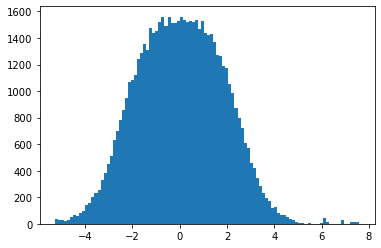

In [24]:
plt.hist(ddf['ft'], bins=100)
plt.show()

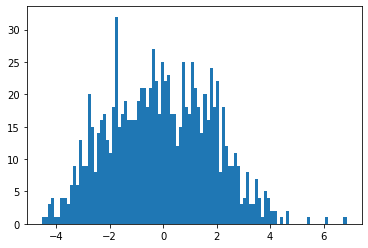

In [25]:
plt.hist(ddf.iloc[:1000]['ft'], bins=100)
plt.show()

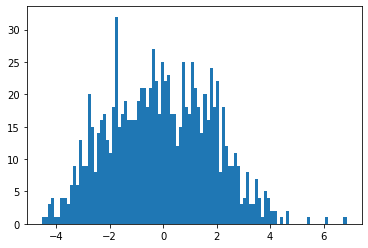

In [26]:
plt.hist(ddf.iloc[:1000]['ft'], bins=100)
plt.show()

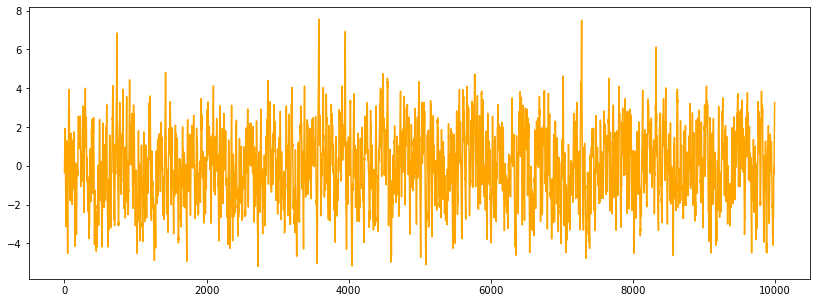

In [27]:
fig, ax1 = plt.subplots(figsize=(14,5))
I = 0
N = 10000
ax1.plot(ddf.iloc[:N]['ft'], color='orange')
# ax1.plot(vals[I:I+N])
# ax2 = ax1.twinx() 
# ax2.plot(lmax[:N], color='green')
# ax2.plot(actions[:N], color='green')
# ax1.plot(vals[I:I+N])
# ax2.plot(ddf.iloc[:N]['ft'], color='orange')

plt.show()

In [28]:
ddf.shape

(61833, 8)

In [29]:
in_row = [ 1 if lmax[0]==1 else -1]
grow = lmax[0]==1
for a, b in zip(lmax[:-1],lmax[1:]):
    if (a==b):
        in_row[-1]+= 1 if b==1 else -1
        continue
    else:
        in_row.append(1 if b==1 else -1)

8722

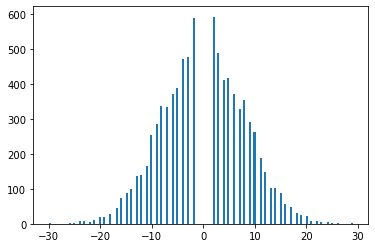

In [31]:
plt.hist(in_row,bins=150)
plt.show()

In [251]:
from collections import Counter

In [255]:
Counter(np.abs(in_row)).items()

dict_items([(10, 515), (16, 130), (7, 661), (14, 202), (17, 95), (5, 805), (2, 1179), (11, 352), (12, 288), (8, 693), (3, 966), (4, 881), (18, 59), (19, 46), (6, 744), (9, 577), (13, 238), (29, 1), (25, 5), (20, 41), (15, 176), (21, 18), (23, 15), (24, 13), (22, 15), (26, 5), (30, 2)])

In [256]:
?sorted

In [258]:
list(sorted(Counter(np.abs(in_row)).items(), key=lambda x: -x[1]))

[(2, 1179),
 (3, 966),
 (4, 881),
 (5, 805),
 (6, 744),
 (8, 693),
 (7, 661),
 (9, 577),
 (10, 515),
 (11, 352),
 (12, 288),
 (13, 238),
 (14, 202),
 (15, 176),
 (16, 130),
 (17, 95),
 (18, 59),
 (19, 46),
 (20, 41),
 (21, 18),
 (23, 15),
 (22, 15),
 (24, 13),
 (25, 5),
 (26, 5),
 (30, 2),
 (29, 1)]

(array([1.179e+03, 0.000e+00, 9.660e+02, 0.000e+00, 8.810e+02, 0.000e+00,
        8.050e+02, 0.000e+00, 7.440e+02, 0.000e+00, 6.610e+02, 0.000e+00,
        6.930e+02, 0.000e+00, 0.000e+00, 5.770e+02, 0.000e+00, 5.150e+02,
        0.000e+00, 3.520e+02, 0.000e+00, 2.880e+02, 0.000e+00, 2.380e+02,
        0.000e+00, 2.020e+02, 0.000e+00, 1.760e+02, 0.000e+00, 0.000e+00,
        1.300e+02, 0.000e+00, 9.500e+01, 0.000e+00, 5.900e+01, 0.000e+00,
        4.600e+01, 0.000e+00, 4.100e+01, 0.000e+00, 1.800e+01, 0.000e+00,
        1.500e+01, 0.000e+00, 0.000e+00, 1.500e+01, 0.000e+00, 1.300e+01,
        0.000e+00, 5.000e+00, 0.000e+00, 5.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 2.000e+00]),
 array([ 2.        ,  2.46666667,  2.93333333,  3.4       ,  3.86666667,
         4.33333333,  4.8       ,  5.26666667,  5.73333333,  6.2       ,
         6.66666667,  7.13333333,  7.6       ,  8.06666667,  8.53333333,
         9.        ,  9.46666667,  9.93

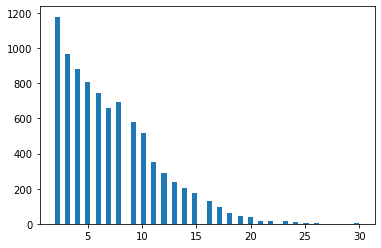

In [250]:
plt.hist(np.abs(in_row),bins=60)


In [32]:
ddf

,date,open,high,low,close,vol,ft,action
0,2023-10-02 22:00:38,14992.00,14992.25,14986.50,14989.50,500,-0.342828,0
1,2023-10-02 22:03:41,14989.75,14992.50,14988.25,14990.50,500,-0.062081,0
2,2023-10-02 22:08:04,14991.00,14992.75,14989.50,14992.00,500,0.396141,0
3,2023-10-02 22:13:26,14992.00,14995.00,14987.75,14989.75,500,0.204056,0
4,2023-10-02 22:14:44,14989.75,14999.00,14989.75,14997.50,500,0.449363,0
...,...,...,...,...,...,...,...,...
61828,2023-11-01 20:45:32,14757.25,14758.75,14754.00,14756.75,500,2.864658,0
61829,2023-11-01 20:48:32,14756.75,14759.00,14753.75,14754.50,500,2.629622,0
61830,2023-11-01 20:53:23,14754.50,14757.00,14753.00,14756.00,500,2.526632,-1
61831,2023-11-01 20:56:02,14756.25,14760.00,14753.25,14755.75,500,2.445323,0


In [122]:
np.zeros(shape=(1,))

array([0.])

In [125]:
np.concatenate((np.zeros(shape=(1,)),tmp_actions))

array([ 0.,  0.,  0., ..., -1.,  0.,  0.])

In [142]:
tmp_actions = ddf['action'].values[:-1]
assert len(np.concatenate((np.zeros(shape=(1,)),tmp_actions))) == ddf.shape[0]
tmp_actions = np.concatenate((np.zeros(shape=(1,)),tmp_actions))

In [144]:
ddf['action_lag'] = tmp_actions

In [178]:
tmp_actions = ddf['action'].values[1:]
assert len(np.concatenate((np.zeros(shape=(1,)),tmp_actions))) == ddf.shape[0]
tmp_actions = np.concatenate((tmp_actions,np.zeros(shape=(1,))))

In [179]:
ddf['action_pred'] = tmp_actions

In [180]:
ddf

,date,open,high,low,close,vol,ft,action,action_lag,action_pred
0,2023-10-02 22:00:38,14992.00,14992.25,14986.50,14989.50,500,-0.342828,0,0.0,0.0
1,2023-10-02 22:03:41,14989.75,14992.50,14988.25,14990.50,500,-0.062081,0,0.0,0.0
2,2023-10-02 22:08:04,14991.00,14992.75,14989.50,14992.00,500,0.396141,0,0.0,0.0
3,2023-10-02 22:13:26,14992.00,14995.00,14987.75,14989.75,500,0.204056,0,0.0,0.0
4,2023-10-02 22:14:44,14989.75,14999.00,14989.75,14997.50,500,0.449363,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
61828,2023-11-01 20:45:32,14757.25,14758.75,14754.00,14756.75,500,2.864658,0,0.0,0.0
61829,2023-11-01 20:48:32,14756.75,14759.00,14753.75,14754.50,500,2.629622,0,0.0,-1.0
61830,2023-11-01 20:53:23,14754.50,14757.00,14753.00,14756.00,500,2.526632,-1,0.0,0.0
61831,2023-11-01 20:56:02,14756.25,14760.00,14753.25,14755.75,500,2.445323,0,-1.0,0.0


In [146]:
np.sum(ddf[ddf['action']!=0]['action']==ddf[ddf['action']!=0]['action_lag'])

0

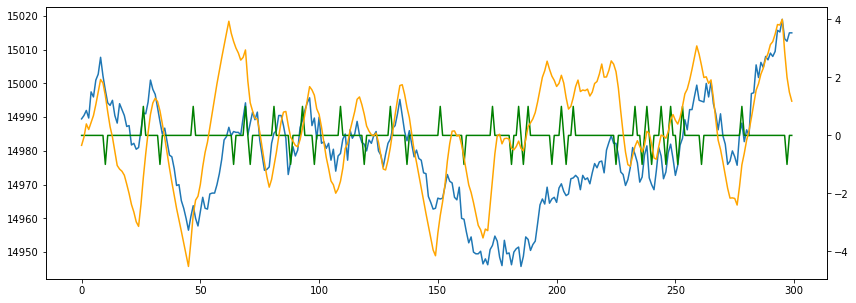

In [33]:
fig, ax1 = plt.subplots(figsize=(14,5))
I = 300
N = 300
ax1.plot( ddf.iloc[:N]['close'])
# ax1.plot(vals[I:I+N])
ax2 = ax1.twinx() 
# ax2.plot(lmax[:N], color='green')
ax2.plot(actions[:N], color='green')
# ax1.plot(vals[I:I+N])
ax2.plot(ddf.iloc[:N]['ft'], color='orange')
plt.show()

In [36]:
# ?ax2.hlines

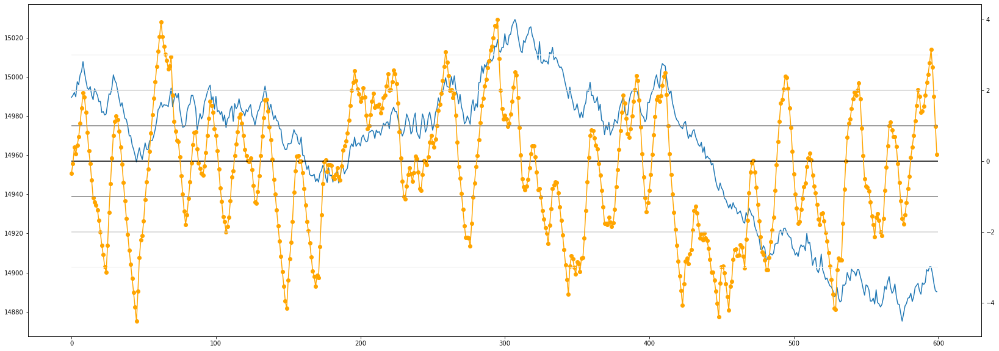

In [37]:
fig, ax1 = plt.subplots(figsize=(28,10))
I = 300
N = 600
ax1.plot( ddf.iloc[:N]['close'])
# ax1.plot(vals[I:I+N])
ax2 = ax1.twinx() 
# ax2.plot(lmax[:N], color='green')
# ax2.plot(actions[:N], color='green')
# ax1.plot(vals[I:I+N])
ax2.hlines(0,0,N, color='black')
ax2.hlines(1,0,N, color='grey')
ax2.hlines(-1,0,N, color='grey')
ax2.hlines(-2,0,N, color='lightgrey')
ax2.hlines(2,0,N, color='lightgrey')

ax2.hlines(3,0,N, color='whitesmoke')
ax2.hlines(-3,0,N, color='whitesmoke')
ax2.plot(ddf.iloc[:N]['ft'], color='orange')
ax2.scatter(range(N),ddf.iloc[:N]['ft'], color='orange')
plt.show()

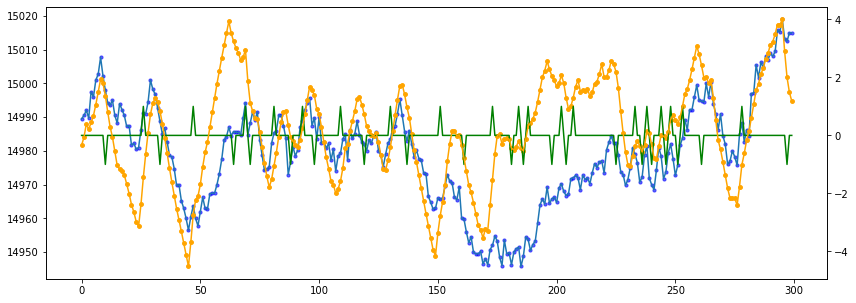

In [38]:
I = 300
N = 300
ddf_data = ddf.iloc[:N]
ft_data = ddf_data['ft']
N_data = range(N)

fig, ax1 = plt.subplots(figsize=(14,5))
ax1.plot   (        ddf_data['close'])
ax1.scatter(N_data, ddf_data['close'], color='blue', s=10,alpha=0.6)

ax2 = ax1.twinx() 
ax2.plot(actions[:N], color='green')
ax2.plot(          ft_data, color='orange')
ax2.scatter(N_data,ft_data, color='orange',s=15)

plt.show()

In [353]:
in_row_arr = np.abs(np.array(in_row[:-1]))
in_row_arr.shape

(8721,)

In [354]:
ddf['inrow'] =0

ddf['inrow'].loc[ddf['action']!=0] = in_row_arr

/home/shmalex/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [355]:
ddf.head(15)

,date,open,high,low,close,vol,ft,action,action_lag,action_pred,inrow
0,2023-10-02 22:00:38,14992.00,14992.25,14986.50,14989.50,500,-0.342828,0,0.0,0.0,0
1,2023-10-02 22:03:41,14989.75,14992.50,14988.25,14990.50,500,-0.062081,0,0.0,0.0,0
2,2023-10-02 22:08:04,14991.00,14992.75,14989.50,14992.00,500,0.396141,0,0.0,0.0,0
3,2023-10-02 22:13:26,14992.00,14995.00,14987.75,14989.75,500,0.204056,0,0.0,0.0,0
4,2023-10-02 22:14:44,14989.75,14999.00,14989.75,14997.50,500,0.449363,0,0.0,0.0,0
5,2023-10-02 22:18:50,14997.50,14999.50,14995.50,14996.00,500,0.684623,0,0.0,0.0,0
6,2023-10-02 22:25:18,14996.00,15001.00,14995.25,15001.00,500,1.064276,0,0.0,0.0,0
7,2023-10-02 22:28:18,15001.00,15003.75,14999.25,15002.75,500,1.491839,0,0.0,0.0,0
8,2023-10-02 22:29:56,15002.75,15010.00,15002.00,15007.75,500,1.929496,0,0.0,0.0,0
9,2023-10-02 22:33:22,15005.00,15006.25,15001.00,15002.25,500,1.805566,0,0.0,-1.0,0


In [ ]:
in_row_arr

# Visualization of the actions

In [63]:
from math import pi
from bokeh.plotting import figure, show
from bokeh.io import output_notebook, show
from bokeh.resources import INLINE

output_notebook(resources=INLINE)
# from bokeh.sampledata.stocks import MSFT

Loading BokehJS ...

In [32]:
?p.triangle

Object `p.triangle` not found.


In [334]:
ddf[ddf['action']!=0].shape

(8721, 10)

In [64]:
# https://docs.bokeh.org/en/2.4.3/docs/gallery/candlestick.html
# https://techflare.blog/how-to-draw-a-candlestick-chart-with-dataframe-in-python-mplfinance-plotly-and-bokeh/

df = ddf.iloc[:5000]
inc = df.close > df.open
dec = df.open > df.close
ask = df.action ==  1
bid = df.action == -1
w = 0.6
x_data = np.array(range(df.shape[0]))
TOOLS = "pan,wheel_zoom,box_zoom,reset,save"

x_range = (0, 150)
y_range = (df[:x_range[1]]['high'].min()-5, df[:x_range[1]]['high'].max()+5)

p = figure(x_axis_type="datetime", tools=TOOLS, width=1000, title = "MNQ", x_range=x_range,  y_range=y_range )
p.xaxis.major_label_orientation = pi/4
p.grid.grid_line_alpha=0.3

p.segment(x_data, df.high, x_data, df.low, color="black")
p.vbar(x_data[inc], w, df.open[inc], df.close[inc], fill_color="green", line_color="black")
p.vbar(x_data[dec], w, df.open[dec], df.close[dec], fill_color="red", line_color="black")
p.triangle(x_data[ask], df.low[ask]-1,  fill_color='green', line_color='green', size=6)
p.triangle(x_data[bid], df.high[bid]+1, fill_color='red',   line_color='red',   size=7, angle=1.04)

show(p)

# TRADING STRATEGY!
## trading simulation

Simple trading staregy - open positions based on the local minimum or maximum

In [319]:

def a(ac):
    return 'B' if ac == 1 else ('S' if ac==-1 else '-')

def ts(ddf, action_col, budget):
    ledger = []
    current_action = [0,0,0]
    open_positions = []
    budget = 200
    budgets = []
    buy_volume = 1
#     action_col = 'action_lag'
    # iterate throw rows filterd Action column which are != 0
    for idx, row in tqdm.tqdm(ddf[ddf[action_col]!=7].iterrows()):
        action = row[action_col]
        budgets.append(budget)

        if action == 0: continue
        # first trade
        if len(open_positions) == 0:
            # price, volume
            # action_price = 'open' if action == 1 else 'open'
            action_price = 'open'
            open_positions.append([row[action_price], buy_volume, action, row['ft']])

            p0, v0, a0, ft0 = open_positions[0]
            if idx <100:
                print(idx, '-', budget, f'P0:{p0} {a0} {a(a0)}, FT:{ft0}')
            continue

        p0, v0, a0, ft0 = open_positions[-1]
        if  a0 == (-1)*action:
            # action_price = 'open' if action == 1 else 'open'

            p1, v1, a1, ft1 = row[action_price], buy_volume, action, row['ft']
            open_positions.pop(0)

            if a0 == -1:
                pnl = (p0*v0) - (p1*v1)
            else:
                pnl = (p1*v1) - (p0*v0)

            budget += pnl*2 - 1.74

            if idx <100:
                print(idx, pnl,budget, f'P0:{p0} {a(a0)} FT:{ft0:0.2}', f'P1:{p1} {a(a1)} FT:{ft1:0.2}')
            ledger.append([len(ledger), p0, p1, pnl, a0, ft0, ft1])

            # reverse position
            open_positions.append([row[action_price], volume, action, row['ft']])
    return budgets, ledger
    #         break
    

In [320]:
budgets_action, ledger_action = ts(ddf, 'action', 200)
budgets_action_lag, ledger_action_lag = ts(ddf, 'action_lag', 200)
budgets_action_pred, ledger_action_pred = ts(ddf, 'action_pred', 200)

2019it [00:00, 10995.21it/s]

10 - 200 P0:15002.25 -1 S, FT:1.3715212564960733
26 16.0 230.26 P0:15002.25 S FT:1.4 P1:14986.25 B FT:-1.5
33 6.5 241.51999999999998 P0:14986.25 B FT:-1.5 P1:14992.75 S FT:0.85
47 32.25 304.28 P0:14992.75 S FT:0.85 P1:14960.5 B FT:-2.7
64 24.0 350.53999999999996 P0:14960.5 B FT:-2.7 P1:14984.5 S FT:3.2
69 -5.25 338.29999999999995 P0:14984.5 S FT:3.2 P1:14989.75 B FT:2.9
71 -5.0 326.55999999999995 P0:14989.75 B FT:2.9 P1:14984.75 S FT:1.1
81 2.5 329.81999999999994 P0:14984.75 S FT:1.1 P1:14982.25 B FT:-1.0
88 -9.25 309.5799999999999 P0:14982.25 B FT:-1.0 P1:14973.0 S FT:-0.059
93 -14.0 279.8399999999999 P0:14973.0 S FT:-0.059 P1:14987.0 B FT:0.25
98 0.5 279.0999999999999 P0:14987.0 B FT:0.25 P1:14987.5 S FT:1.4


61833it [00:03, 16344.17it/s]
2746it [00:00, 14230.04it/s]

11 - 200 P0:14998.25 -1.0 S, FT:0.8143752939573068
27 7.0 212.26 P0:14998.25 S FT:0.81 P1:14991.25 B FT:-0.64
34 -2.5 205.51999999999998 P0:14991.25 B FT:-0.64 P1:14988.75 S FT:0.4
48 25.0 253.77999999999997 P0:14988.75 S FT:0.4 P1:14963.75 B FT:-2.2
65 22.25 296.53999999999996 P0:14963.75 B FT:-2.2 P1:14986.0 S FT:3.0
70 -8.25 278.29999999999995 P0:14986.0 S FT:3.0 P1:14994.25 B FT:1.9
72 -6.0 264.55999999999995 P0:14994.25 B FT:1.9 P1:14988.25 S FT:0.84
82 3.0 268.81999999999994 P0:14988.25 S FT:0.84 P1:14985.25 B FT:-0.59
89 -8.75 249.57999999999993 P0:14985.25 B FT:-0.59 P1:14976.5 S FT:-0.2
94 -12.5 222.83999999999992 P0:14976.5 S FT:-0.2 P1:14989.0 B FT:0.72
99 0.5 222.0999999999999 P0:14989.0 B FT:0.72 P1:14989.5 S FT:0.92


61833it [00:04, 12573.60it/s]
2730it [00:00, 14134.26it/s]

9 - 200 P0:15005.0 -1.0 S, FT:1.8055658695922407
25 24.0 246.26 P0:15005.0 S FT:1.8 P1:14981.0 B FT:-2.4
32 15.75 276.02 P0:14981.0 B FT:-2.4 P1:14996.75 S FT:1.2
46 40.25 354.78 P0:14996.75 S FT:1.2 P1:14956.5 B FT:-3.7
63 30.5 414.03999999999996 P0:14956.5 B FT:-3.7 P1:14987.0 S FT:3.5
68 2.25 416.79999999999995 P0:14987.0 S FT:3.5 P1:14984.75 B FT:2.7
70 9.5 434.05999999999995 P0:14984.75 B FT:2.7 P1:14994.25 S FT:1.9
80 19.0 470.31999999999994 P0:14994.25 S FT:1.9 P1:14975.25 B FT:-1.5
87 8.5 485.5799999999999 P0:14975.25 B FT:-1.5 P1:14983.75 S FT:0.35
92 3.5 490.8399999999999 P0:14983.75 S FT:0.35 P1:14980.25 B FT:-0.14
97 15.0 519.0999999999999 P0:14980.25 B FT:-0.14 P1:14995.25 S FT:1.6


61833it [00:03, 16265.18it/s]


In [321]:
len(ledger)

8721

In [322]:
ldf1

,idx,open,close,pnl,action,openft,closeft
0,0,15002.25,14986.25,16.00,-1,1.371521,-1.450445
1,1,14986.25,14992.75,6.50,1,-1.450445,0.845782
2,2,14992.75,14960.50,32.25,-1,0.845782,-2.729398
3,3,14960.50,14984.50,24.00,1,-2.729398,3.240847
4,4,14984.50,14989.75,-5.25,-1,3.240847,2.946741
...,...,...,...,...,...,...,...
8715,8715,14740.75,14746.75,6.00,1,-1.806881,0.859406
8716,8716,14746.75,14737.25,9.50,-1,0.859406,-1.748815
8717,8717,14737.25,14741.00,3.75,1,-1.748815,0.481614
8718,8718,14741.00,14744.75,-3.75,-1,0.481614,0.880219


In [323]:
#         ledger        .append([row[action_price], volume, action])
ldf1 = pd.DataFrame(ledger_action, columns=['idx','open','close', 'pnl', 'action', 'openft','closeft'])
ldf1.head()

,idx,open,close,pnl,action,openft,closeft
0,0,15002.25,14986.25,16.00,-1,1.371521,-1.450445
1,1,14986.25,14992.75,6.50,1,-1.450445,0.845782
2,2,14992.75,14960.50,32.25,-1,0.845782,-2.729398
3,3,14960.50,14984.50,24.00,1,-2.729398,3.240847
4,4,14984.50,14989.75,-5.25,-1,3.240847,2.946741


In [356]:
ldf1.shape

(8720, 7)

In [324]:
#         ledger        .append([row[action_price], volume, action])
ldf2 = pd.DataFrame(ledger_action_lag, columns=['idx','open','close', 'pnl', 'action', 'openft','closeft'])
ldf2.head()

,idx,open,close,pnl,action,openft,closeft
0,0,14998.25,14991.25,7.00,-1.0,0.814375,-0.635415
1,1,14991.25,14988.75,-2.50,1.0,-0.635415,0.397239
2,2,14988.75,14963.75,25.00,-1.0,0.397239,-2.232419
3,3,14963.75,14986.00,22.25,1.0,-2.232419,3.009769
4,4,14986.00,14994.25,-8.25,-1.0,3.009769,1.870749


In [325]:
#         ledger        .append([row[action_price], volume, action])
ldf3 = pd.DataFrame(ledger_action_pred, columns=['idx','open','close', 'pnl', 'action', 'openft','closeft'])
ldf3.head()

,idx,open,close,pnl,action,openft,closeft
0,0,15005.00,14981.00,24.00,-1.0,1.805566,-2.381393
1,1,14981.00,14996.75,15.75,1.0,-2.381393,1.165255
2,2,14996.75,14956.50,40.25,-1.0,1.165255,-3.680084
3,3,14956.50,14987.00,30.50,1.0,-3.680084,3.524677
4,4,14987.00,14984.75,2.25,-1.0,3.524677,2.689784


In [326]:
ldf1['pnl'].describe()

count    8720.000000
mean        2.078928
std         9.008320
min       -71.750000
25%        -4.250000
50%        -0.250000
75%         6.750000
max       101.750000
Name: pnl, dtype: float64

In [327]:
ldf2['pnl'].describe()

count    8720.000000
mean       -0.067775
std         9.156360
min      -119.000000
25%        -6.250000
50%        -2.250000
75%         4.500000
max        87.500000
Name: pnl, dtype: float64

In [328]:
ldf2['pnl'].describe()

count    8720.000000
mean       -0.067775
std         9.156360
min      -119.000000
25%        -6.250000
50%        -2.250000
75%         4.500000
max        87.500000
Name: pnl, dtype: float64

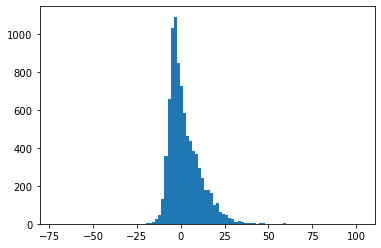

In [329]:
plt.hist(ldf1['pnl'], bins=100)
plt.show()

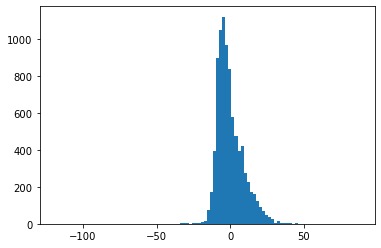

In [330]:
plt.hist(ldf2['pnl'], bins=100)
plt.show()

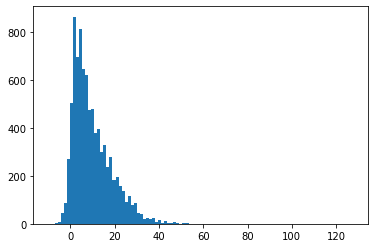

In [331]:
plt.hist(ldf3['pnl'], bins=100)
plt.show()

In [104]:
import matplotlib.cm as cm
# https://stackoverflow.com/questions/31869732/getting-color-from-0-1-range-in-matplotlib

len(sc_pnl), len(sc_pnl[sc_pnl>=0]), len(sc_pnl[sc_pnl<=0])

## Visualization 
- what is the profit of current signal versus the count of candles of previous candle

In [361]:
ldf1['inrow'] = ddf[ddf['inrow']!=0]['inrow'].values[:-1]

In [362]:
ldf1

,idx,open,close,pnl,action,openft,closeft,inrow
0,0,15002.25,14986.25,16.00,-1,1.371521,-1.450445,10
1,1,14986.25,14992.75,6.50,1,-1.450445,0.845782,16
2,2,14992.75,14960.50,32.25,-1,0.845782,-2.729398,7
3,3,14960.50,14984.50,24.00,1,-2.729398,3.240847,14
4,4,14984.50,14989.75,-5.25,-1,3.240847,2.946741,17
...,...,...,...,...,...,...,...,...
8715,8715,14740.75,14746.75,6.00,1,-1.806881,0.859406,2
8716,8716,14746.75,14737.25,9.50,-1,0.859406,-1.748815,12
8717,8717,14737.25,14741.00,3.75,1,-1.748815,0.481614,9
8718,8718,14741.00,14744.75,-3.75,-1,0.481614,0.880219,7


In [417]:
?np.random.uniform

In [416]:
np.random.uniform(-0.25,0.25)

0.18200726422567165

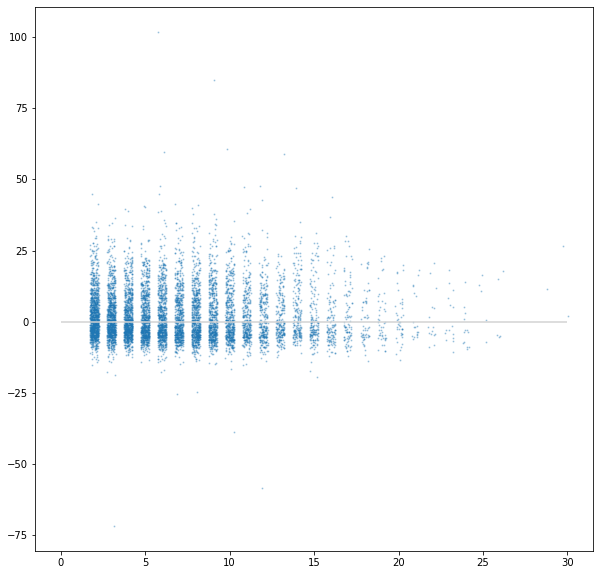

In [420]:
plt.figure(figsize=(10,10))
plt.hlines(0,0,30,color='lightgray')
plt.scatter(ldf1['inrow']+np.random.uniform(-0.25,0.25, ldf1['inrow'].shape[0]), ldf1['pnl'], alpha=0.3,s =1)
plt.show()

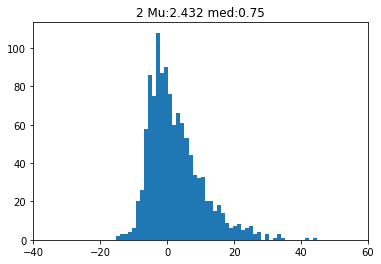

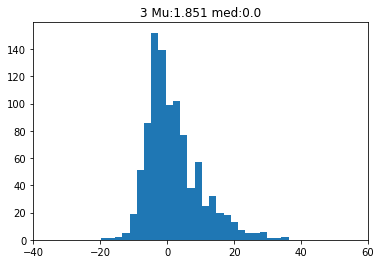

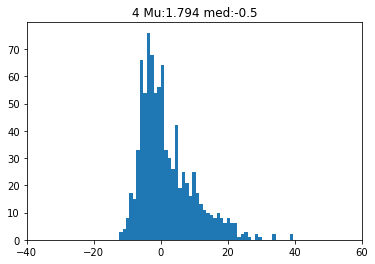

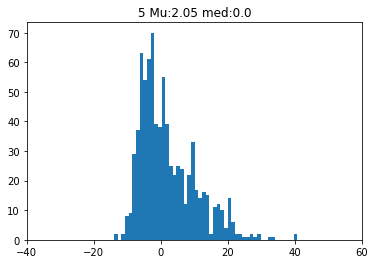

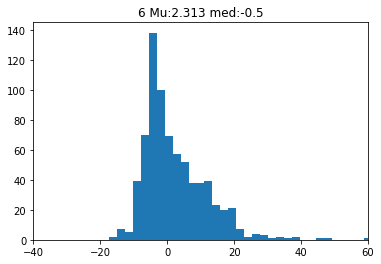

...

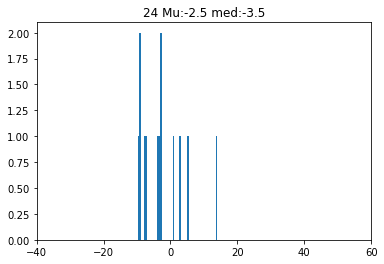

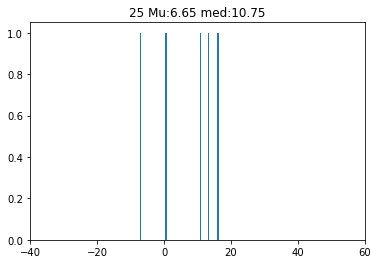

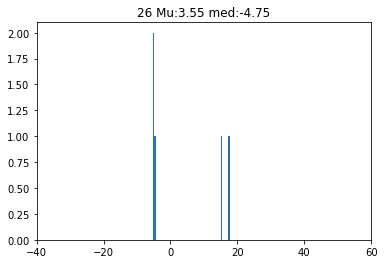

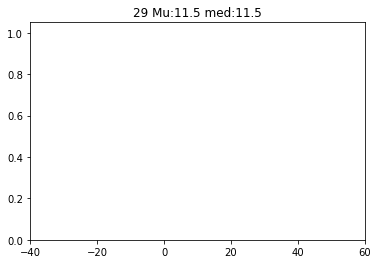

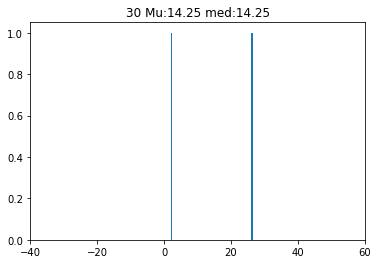

In [388]:
for x in sorted(ldf1['inrow'].unique()):
    tmp_data = ldf1[ldf1['inrow']==x]['pnl']
    plt.hist(tmp_data, bins=50)
    plt.xlim((-40,60))
    plt.title(f'{x} Mu:{np.mean(tmp_data):0.4} med:{np.median(tmp_data):0.4}')
    plt.show()
#     break

In [389]:
ldf1

,idx,open,close,pnl,action,openft,closeft,inrow
0,0,15002.25,14986.25,16.00,-1,1.371521,-1.450445,10
1,1,14986.25,14992.75,6.50,1,-1.450445,0.845782,16
2,2,14992.75,14960.50,32.25,-1,0.845782,-2.729398,7
3,3,14960.50,14984.50,24.00,1,-2.729398,3.240847,14
4,4,14984.50,14989.75,-5.25,-1,3.240847,2.946741,17
...,...,...,...,...,...,...,...,...
8715,8715,14740.75,14746.75,6.00,1,-1.806881,0.859406,2
8716,8716,14746.75,14737.25,9.50,-1,0.859406,-1.748815,12
8717,8717,14737.25,14741.00,3.75,1,-1.748815,0.481614,9
8718,8718,14741.00,14744.75,-3.75,-1,0.481614,0.880219,7


<AxesSubplot:>

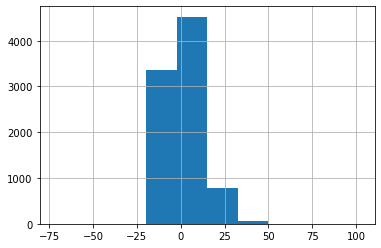

In [392]:
ldf1['pnl'].hist()

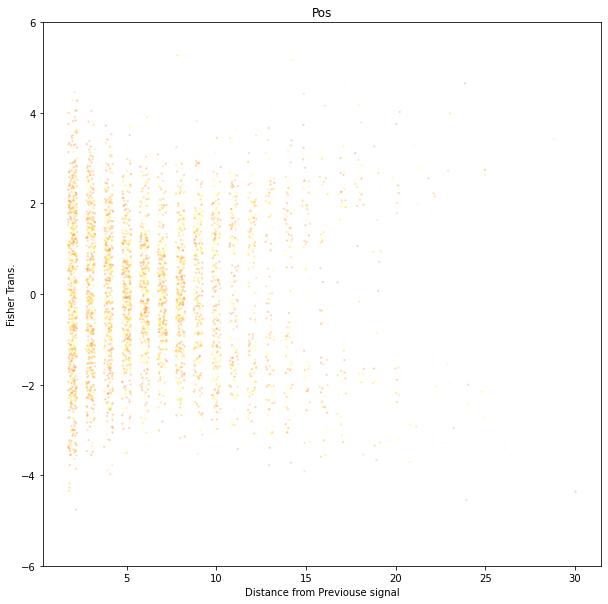

In [435]:
# plt.figure(figsize=(10,10))
# plt.hlines(0,0,30,color='lightgray')
# 
# plt.show()
pltfilter = ldf1['pnl']>0

plt.figure(figsize=(10,10))
plt.scatter(ldf1[pltfilter]['inrow']+np.random.uniform(-0.25,0.25, np.sum(pltfilter)),
            ldf1[pltfilter]['openft'],
            c=ldf1[ldf1['pnl']>0]['pnl'],
            alpha=0.2, cmap=cm.hot, vmax=25,vmin=-25, s=2)
# plt.xlim(alim)
plt.ylim(alim)
plt.xlabel('Distance from Previouse signal')
plt.ylabel('Fisher Trans.')
# plt.title(pre_title+' All Trades')
plt.title("Pos")

plt.show()

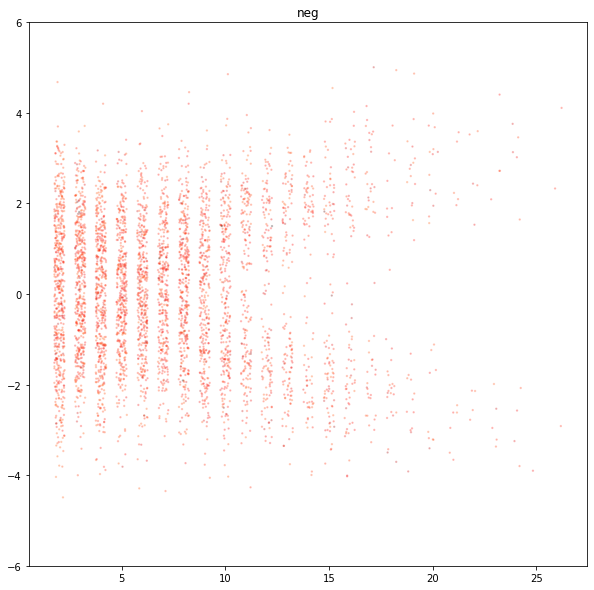

In [436]:
pltfilter = ldf1['pnl']<0
plt.figure(figsize=(10,10))
plt.scatter(ldf1[pltfilter]['inrow']+np.random.uniform(-0.25,0.25, np.sum(pltfilter)),
            ldf1[pltfilter]['openft'],
            c=ldf1[pltfilter]['pnl'],
            alpha=0.2, cmap=cm.hot, vmax=25,vmin=-25, s=2)
# plt.xlim(alim)
plt.ylim(alim)
plt.title("neg")
plt.show()

In [ ]:
char

In [234]:
def pnl_charts(ldf, action_col, pre_title):
    ldf_filter = np.abs(ldf['openft']) >= 0
    sc_openft = ldf[ldf_filter]['openft']
    sc_closeft = ldf[ldf_filter]['closeft']
    sc_pnl = ldf[ldf_filter]['pnl']
    sc_action = ldf[ldf_filter][action_col]
    vmax = 12 #max(sc_pnl)
    vmin = -12 #min(sc_pnl)

    alim = (-6,6)
    plt.figure(figsize=(10,10))
    plt.scatter(sc_openft, sc_closeft, alpha=0.1)#, c=sc_pnl, cmap=cm.rainbow)
    plt.xlim(alim)
    plt.ylim(alim)
    plt.title(pre_title+' All Trades')
    plt.show()

    plt.figure(figsize=(10,10))
    plt.scatter(sc_openft, sc_closeft, c=sc_pnl,  alpha=0.1, cmap=cm.rainbow, vmax=vmax,vmin=vmin)
    plt.xlim(alim)
    plt.ylim(alim)
    plt.title(pre_title+' All Trades')
    plt.show()



    plt.figure(figsize=(10,10))
    plt.scatter(sc_openft[sc_action==-1], sc_closeft[sc_action==-1], alpha=0.1, c=sc_pnl[sc_action==-1], cmap=cm.rainbow, vmax=vmax,vmin=vmin)
    plt.title(pre_title+' All Sell Trades')
    plt.xlim(alim)
    plt.ylim(alim)
    plt.show()


    plt.figure(figsize=(10,10))
    plt.scatter(sc_openft[sc_action==1], sc_closeft[sc_action==1], alpha=0.1, c=sc_pnl[sc_action==-1], cmap=cm.rainbow, vmax=vmax,vmin=vmin)
    plt.title(pre_title+' All Buys Trades')
    plt.xlim(alim)
    plt.ylim(alim)
    plt.show()


    pnl_filter = sc_pnl < 0
    plt.figure(figsize=(10,10))
    plt.scatter(sc_openft[pnl_filter], sc_closeft[pnl_filter], alpha=0.5, c=sc_pnl[pnl_filter], cmap=cm.rainbow, vmax=vmax,vmin=vmin)
    plt.title(pre_title+' Negative Trades')
    plt.xlim(alim)
    plt.ylim(alim)
    plt.show()


    pnl_filter = sc_pnl > 0
    plt.figure(figsize=(10,10))
    plt.scatter(sc_openft[pnl_filter], sc_closeft[pnl_filter], alpha=0.5, c=sc_pnl[pnl_filter], cmap=cm.rainbow, vmax=vmax,vmin=vmin)
    plt.title(pre_title+' Positive Trades')
    plt.xlim(alim)
    plt.ylim(alim)
    plt.show()


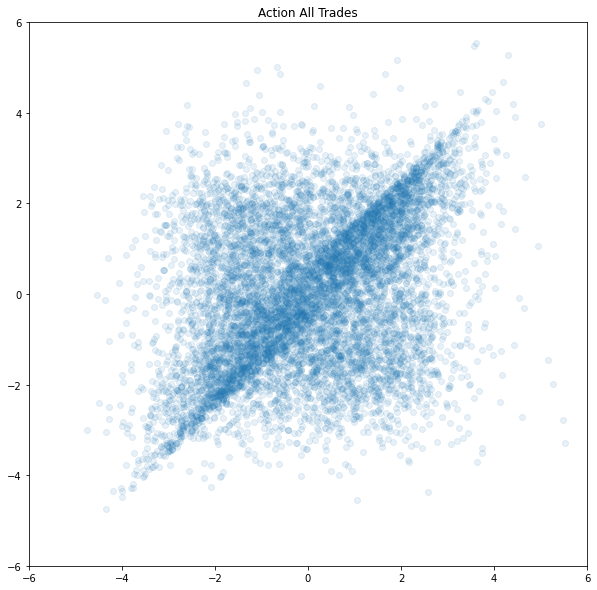

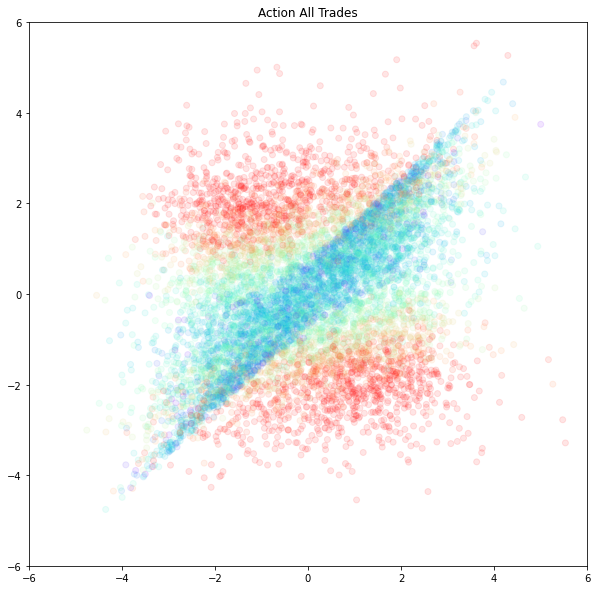

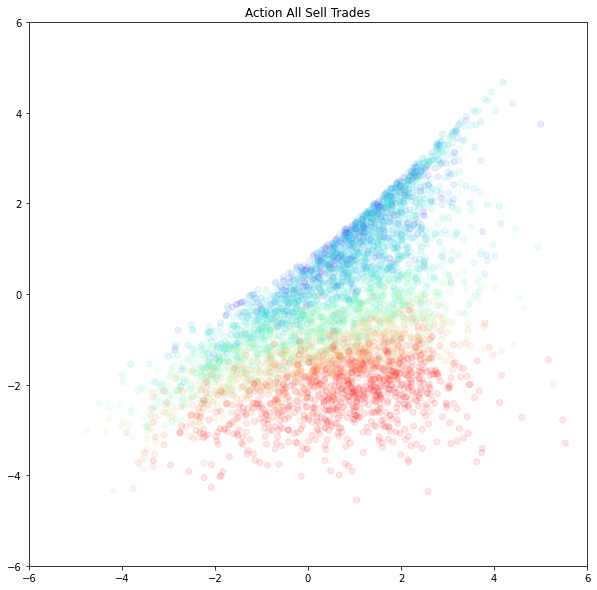

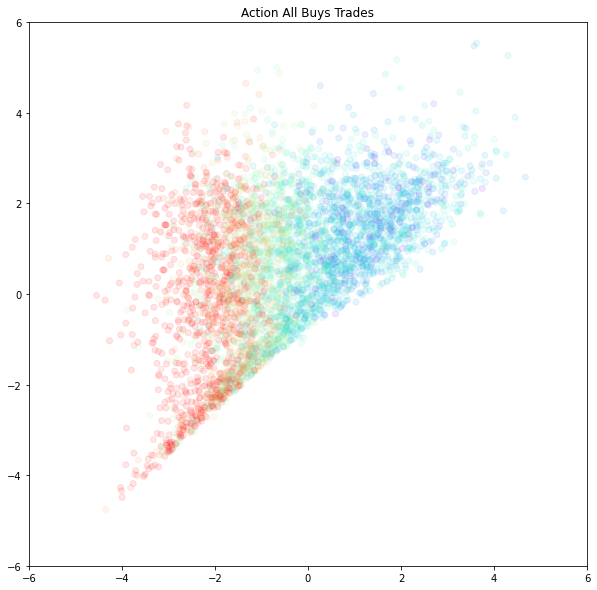

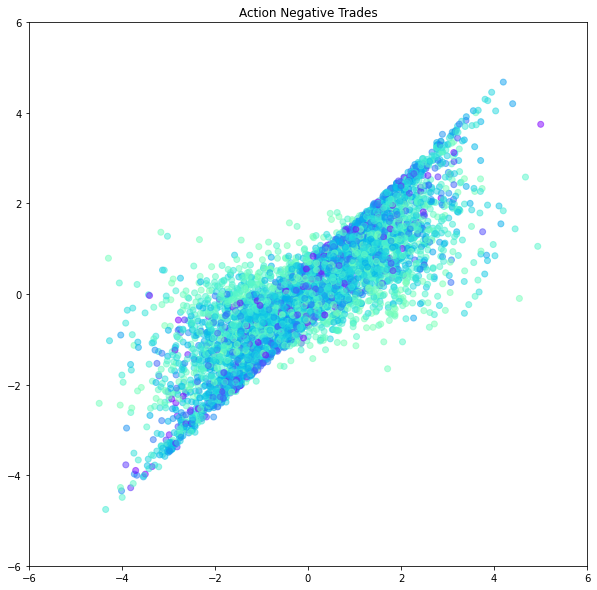

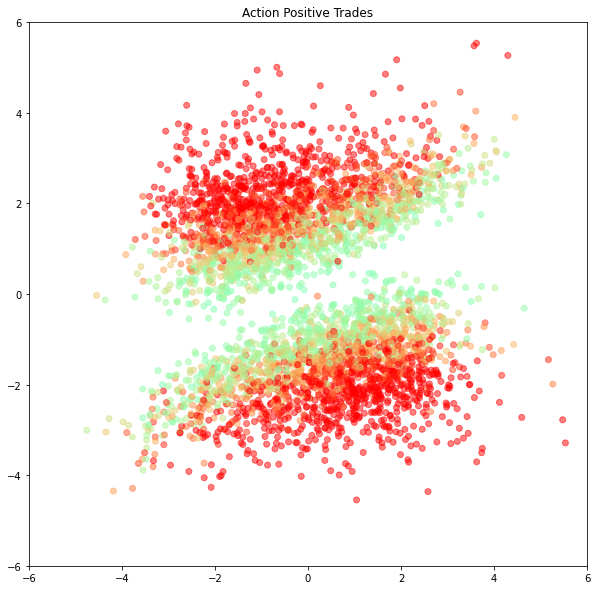

In [235]:
pnl_charts(ldf1,'action', 'Action')

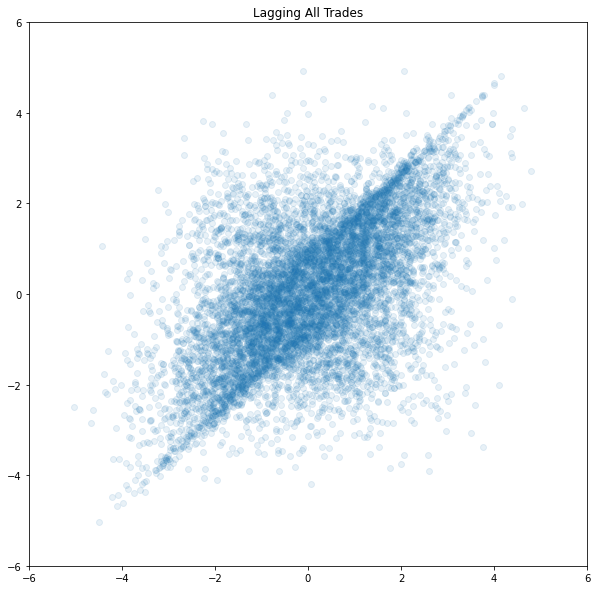

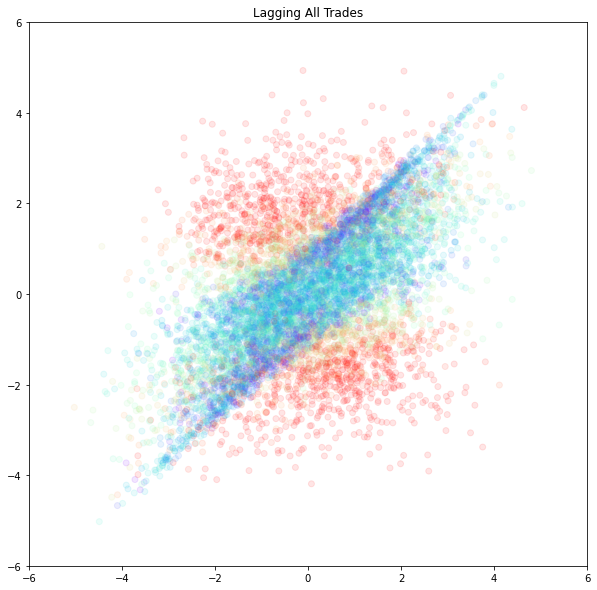

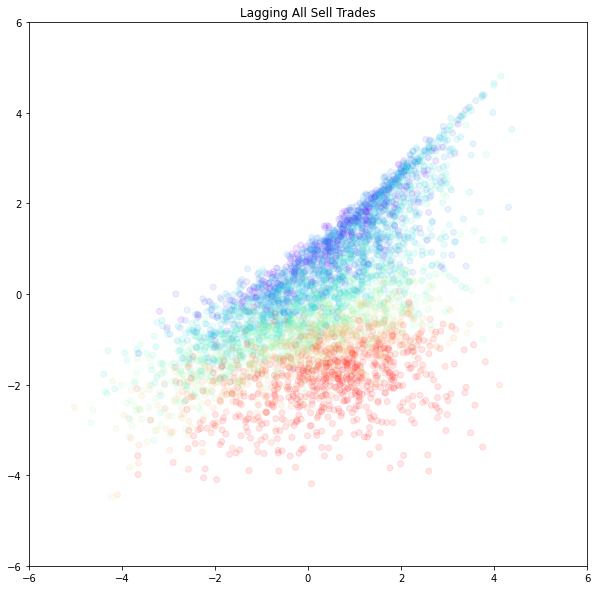

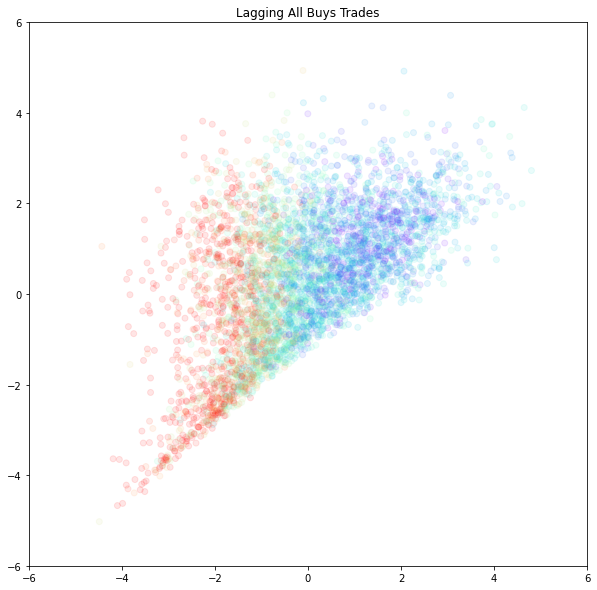

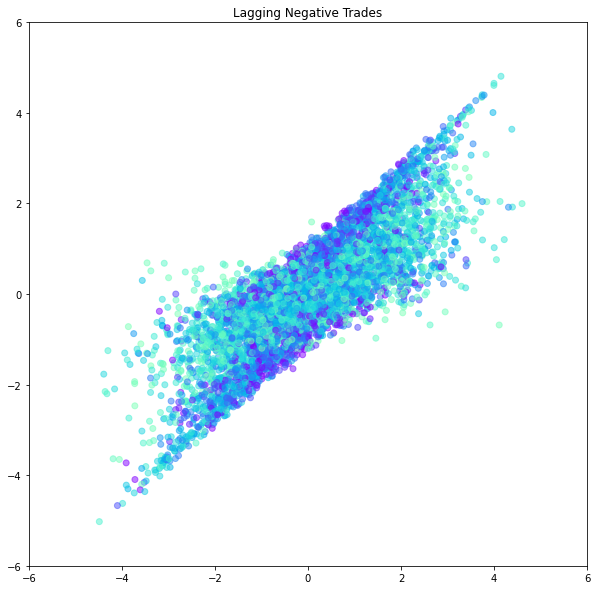

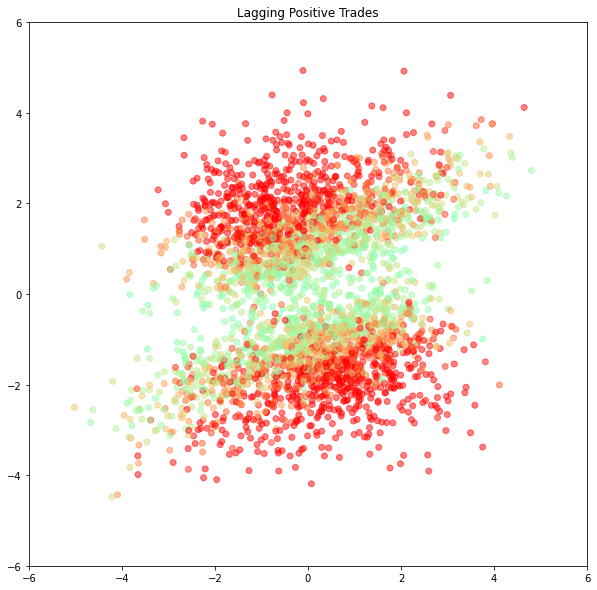

In [236]:
pnl_charts(ldf2, 'action', "Lagging")

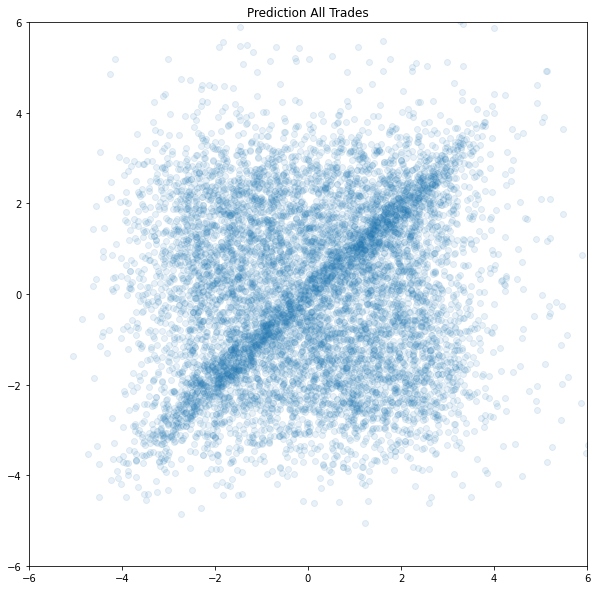

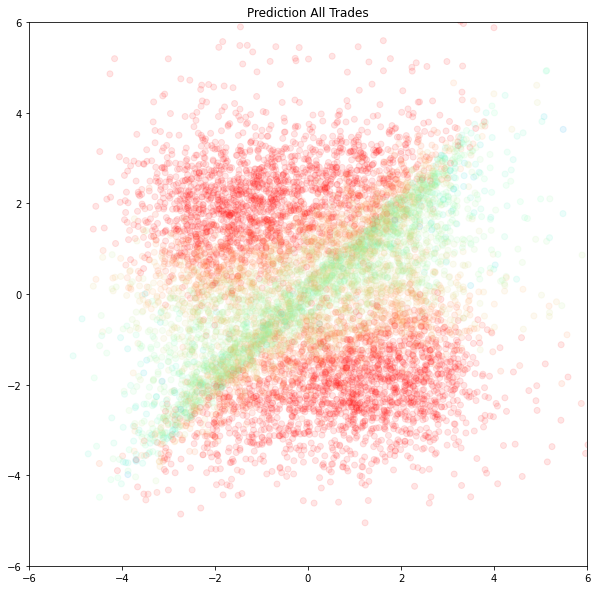

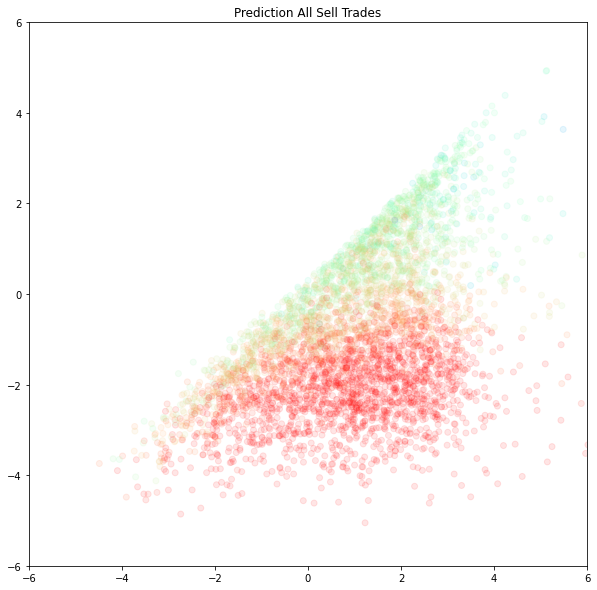

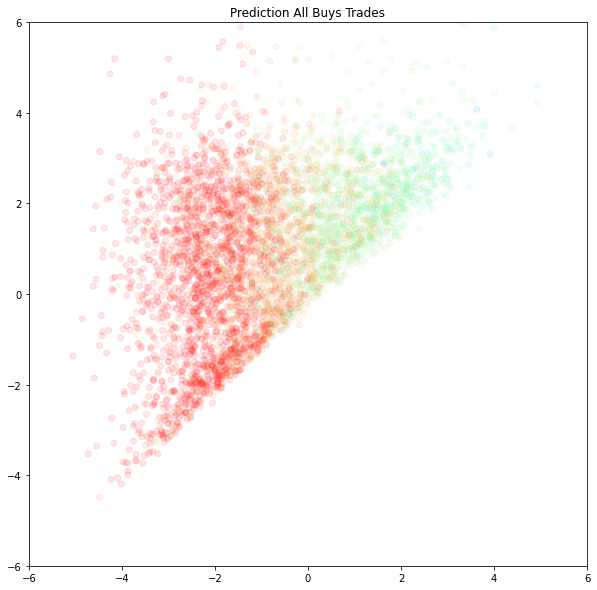

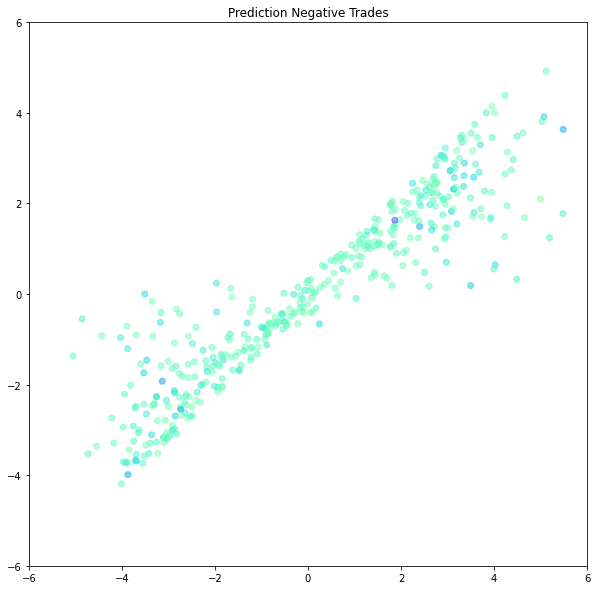

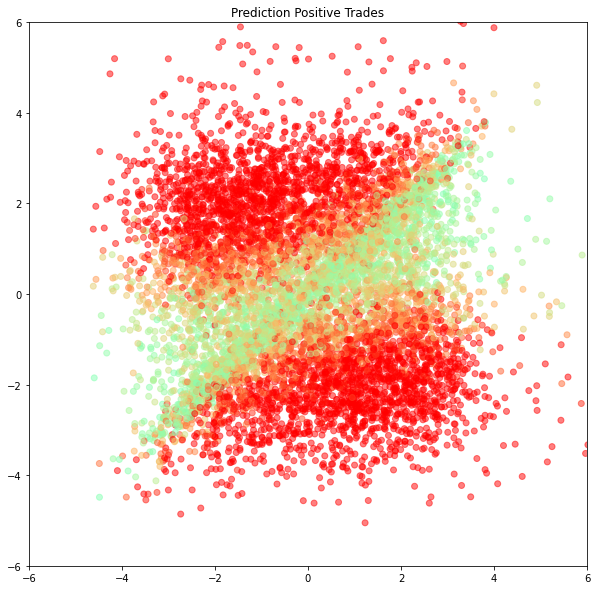

In [237]:
pnl_charts(ldf3, 'action', 'Prediction')

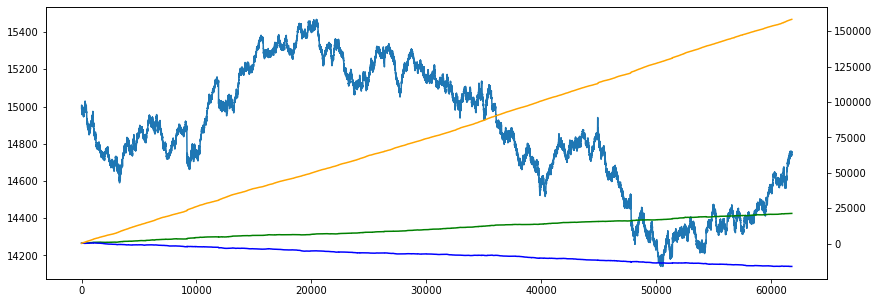

In [332]:
fig, ax1 = plt.subplots(figsize=(14,5))
I = 0
N = -1
ax1.plot( ddf.iloc[:N]['close'])
# ax1.plot(vals[I:I+N])
ax2 = ax1.twinx() 
ax2.plot(budgets_action[:N], color='green')
ax2.plot(budgets_action_lag[:N], color='blue')
ax2.plot(budgets_action_pred[:N], color='orange')
# ax2.plot(np.array(actions[:N])*50+301, color='orange', alpha=0.5)
# ax2.plot(actions[:N], color='green')
# ax1.plot(vals[I:I+N])
# ax2.plot(ddf.iloc[:N]['ft'], color='orange')
plt.show()

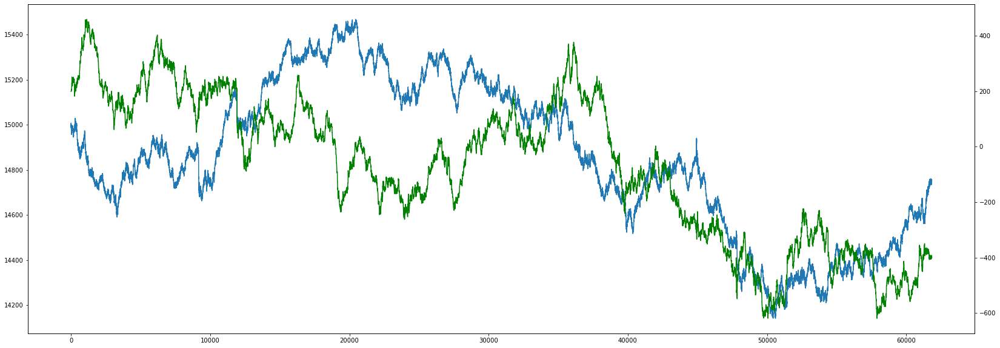

In [174]:
fig, ax1 = plt.subplots(figsize=(28,10))
I = 0
N = -1
ax1.plot( ddf.iloc[:N]['close'])
# ax1.plot(vals[I:I+N])
ax2 = ax1.twinx() 
ax2.plot(budgets_action_lag[:N], color='green')
# ax2.plot(np.array(actions[:N])*50+301, color='orange', alpha=0.5)
# ax2.plot(actions[:N], color='green')
# ax1.plot(vals[I:I+N])
# ax2.plot(ddf.iloc[:N]['ft'], color='orange')
plt.show()

In [186]:
budgets_action_pred[-1]

86857.75

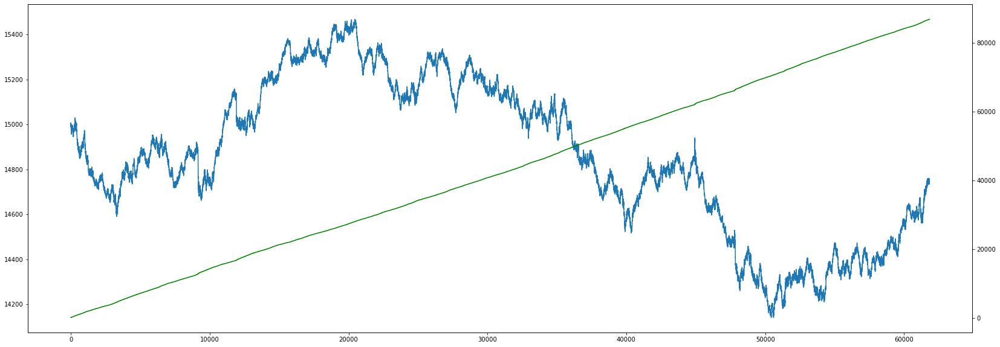

In [185]:
fig, ax1 = plt.subplots(figsize=(28,10))
I = 0
N = -1
ax1.plot( ddf.iloc[:N]['close'])
# ax1.plot(vals[I:I+N])
ax2 = ax1.twinx() 
ax2.plot(budgets_action_pred[:N], color='green')
# ax2.plot(np.array(actions[:N])*50+301, color='orange', alpha=0.5)
# ax2.plot(actions[:N], color='green')
# ax1.plot(vals[I:I+N])
# ax2.plot(ddf.iloc[:N]['ft'], color='orange')
plt.show()

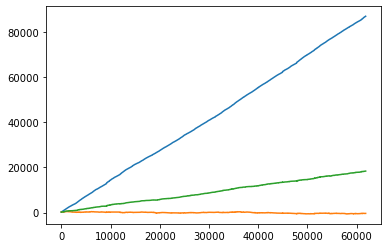

In [187]:
plt.plot(budgets_action_pred)
plt.plot(budgets_action_lag)
plt.plot(budgets_action)
plt.show()

# Trading Strategy # 2

Traiding the N points unders or over the signals Open Price

Let's Build the distribution of what are the Low and High after the open price signals

Mean 2.962164641137354 Median 2.75


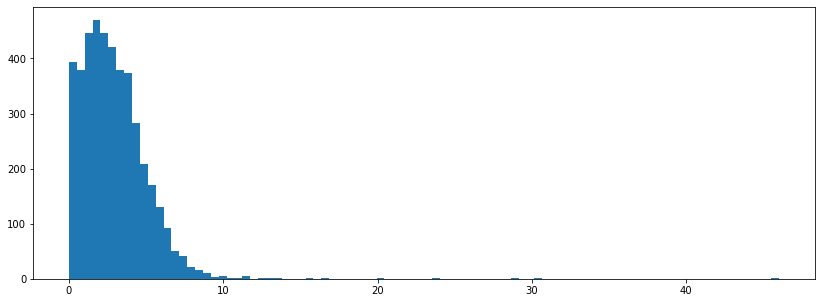

In [176]:
s2pnls = ddf['open']-ddf['low']
s2pnl = s2pnls[ddf['action']==-1]
print("Mean", s2pnl.mean(), "Median", np.median(s2pnl))
plt.figure(figsize=(14,5))
plt.hist(s2pnl, bins=90)
plt.show()

Mean 2.9196674311926607 Median 2.75


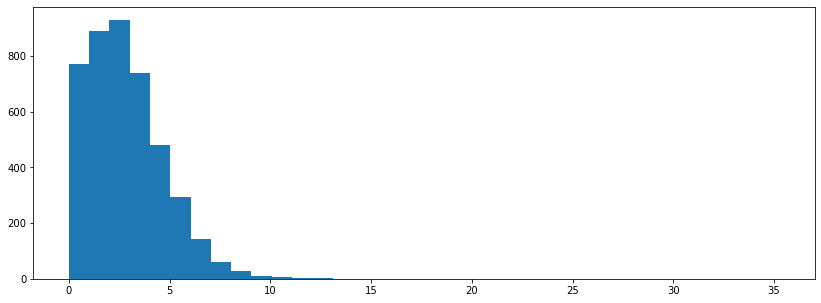

In [177]:
s2pnls = ddf['high']-ddf['open']
s2pnl = s2pnls[ddf['action']==1]
print("Mean", s2pnl.mean(), "Median", np.median(s2pnl))
plt.figure(figsize=(14,5))
plt.hist(s2pnl, bins=35)
plt.show()

Mean 2.5680623615221645 Median 2.25


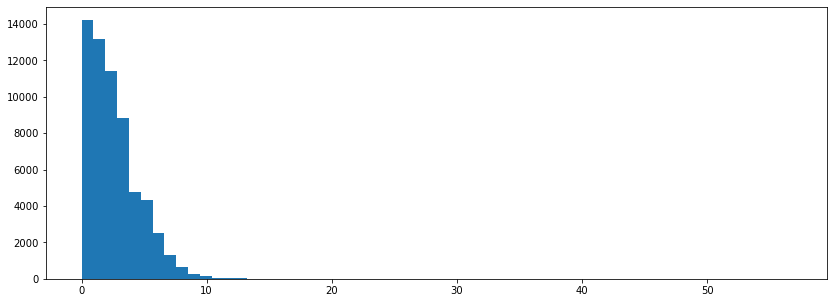

In [178]:
s2pnl = ddf['high']-ddf['open']
print("Mean", s2pnl.mean(), "Median", np.median(s2pnl))
plt.figure(figsize=(14,5))
plt.hist(s2pnl, bins=60)
plt.show()

Mean 2.5722308476056477 Median 2.25


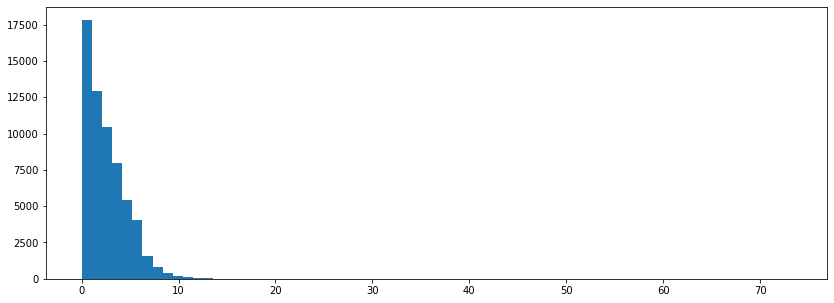

In [179]:
s2pnl = ddf['open']-ddf['low']
print("Mean", s2pnl.mean(), "Median", np.median(s2pnl))
plt.figure(figsize=(14,5))
plt.hist(s2pnl, bins=70)
plt.show()

In [152]:
s2pnl.mean()

2.962164641137354

In [ ]:
s2open

In [ ]:
def a(ac):
    return 'B' if ac == 1 else ('S' if ac==-1 else '-')

ledger = []
current_action = [0,0,0]
open_positions = []
budget = 200
budgets = []
volume = 1

# iterate throw rows filterd Action column which are != 0
for idx, row in tqdm.tqdm(ddf.iterrows()):
    action = row['action']
    #     budgets.append(budget)

    if row['action'] != 0:
        
    # first trade
    if len(open_positions) == 0:
        # price, volume
        # action_price = 'open' if action == 1 else 'open'
        action_price = 'open'
        open_positions.append([row[action_price], volume, action, row['ft']])

        p0, v0, a0, ft0 = open_positions[0]
        if idx <100:
            print(idx, 0.0, budget, f'P0:{p0} {a0} {a(a0)}, FT:{ft0}')
        continue

    if  open_positions[0][2]==(-1)*action:
        # action_price = 'open' if action == 1 else 'open'
        
        p0,v0,a0,ft0 = open_positions[0]
        p1,v1,a1,ft1 = row[action_price],volume, action, row['ft']
        open_positions.pop(0)
        
        if a0 == -1: # SELL
            pl = p0*v0 - p1*v1
        else:
            pl = p1*v1 - p0*v0
        budget += pl
        if idx <100:
            print(idx, pl,budget, f'P0:{p0} {a(a0)} FT:{ft0:0.2}', f'P1:{p1} {a(a1)} FT:{ft1:0.2}')
        ledger.append([len(ledger), p0, p1, pl, a0, ft0, ft1])
        
        # reverse position
        open_positions.append([row[action_price], volume, action, row['ft']])

#         break
    

https://ninjatrader.com/margin-details/?symbol=MNQ

| SPECIFICATIONS      | TRADING HOURS    | FEES             | MARGIN VIEW ALL |
| ------------------- | ---------------- | ---------------- | --------------- |
| **Value Per Point** | **Sunday Open**  | **Exchange Fee** | **Day**         |
| \$2\.00             | 17:00            | \$0.35           | \$100.00    |
| **Months**          | **Open**         | **NFA Fee**      | **Night**   |
| HMUZ                | 17:00            | \$0.02           | -           |
| **Tick**            | **Close**        | **Clearing Fee** | **Initial** |
| 0.25 / \$0.50       | 16:00            | \$0.15           | \$1848.00   |

In [297]:
def a(ac):
    return 'B' if ac == 1 else ('S' if ac==-1 else '-')
DEFAULT_VALUE=NJ_VALUE
DEFAULT_COMM=NJ_COMMISSION
def ts2(ddf, lim, action_col, volume, value=DEFAULT_VALUE, commission=DEFAULT_COMM):
    ledger = []
    current_action = [0,0,0]
    open_positions = []
    budget = 200
    budgets = []
#     volume = 1
    # value = 2
    # commission = 1.74
#     lim = 1.5
    # iterate throw rows filterd Action column which are != 0
#     for idx, row in tqdm.tqdm_notebook(ddf[ddf[action_col]!=5].iterrows(), desc=f'lim={lim}', leave=False):
    for idx, row in ddf[ddf[action_col]!=5].iterrows():
        action = row[action_col]
        budgets.append(budget)
        if action == 0: continue
        if action == 1:
            if (row['high'] - row['open']) > lim:
                ledger.append([len(ledger), row['open'], row['open']+lim, lim, action, row['ft']])
                budget += lim * value * volume 
            else:
                ledger.append([len(ledger), row['open'], row['open']-lim, -lim, action, row['ft']])
                budget -= lim * value * volume
        else:
            if (row['open'] - row['low']) > lim:
                ledger.append([len(ledger), row['open'], row['open']-lim, lim, action, row['ft']])
                budget += lim * value * volume
            else:
                ledger.append([len(ledger), row['open'], row['open']+lim, -lim, action, row['ft']])
                budget -= lim * value * volume
        budget -= commission * volume
    return budgets, ledger


In [298]:
b25, l25 = ts2(ddf, 2.5, 'action', 1)
b25_2, l25 = ts2(ddf, 2.5, 'action', 10)
b20, l20 = ts2(ddf, 2,   'action', 1) 
b20_2, l20 = ts2(ddf, 2,   'action', 10) 
b15, l15 = ts2(ddf, 1.5, 'action', 1)
b15_2, l15 = ts2(ddf, 1.5, 'action', 10)
b10, l10 = ts2(ddf, 1.0, 'action', 1)
b10_2, l10 = ts2(ddf, 1.0, 'action', 10)

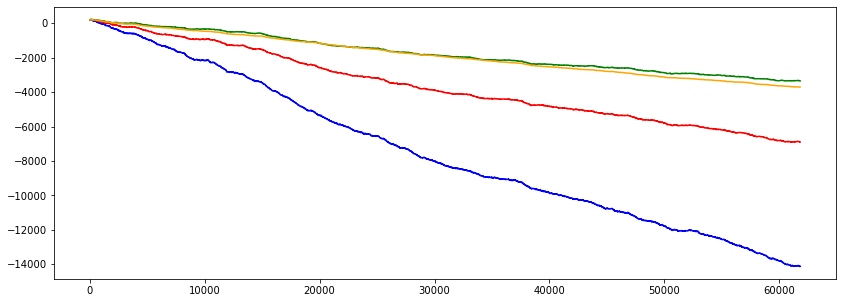

In [300]:
fig, ax1 = plt.subplots(figsize=(14,5))
plt.plot(b25, color='blue')
# plt.plot(b25_2, color='blue', linestyle='dashed')
plt.plot(b20, color='red')
# plt.plot(b20_2, color='red', linestyle='dashed')
plt.plot(b15, color='green')
# plt.plot(b15_2, color='green', linestyle='dashed')
plt.plot(b10, color='orange')
# plt.plot(b10_2, color='orange', linestyle='dashed')
plt.hlines(0, 0.5, 3.5)
plt.show()

In [302]:
blimdata = []
for blim in tqdm.tqdm_notebook(np.linspace(0.5, 3.5, 100), desc='Action'):
    blimdata.append(ts2(ddf, blim, 'action', 1))

/home/shmalex/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


Action:   0%|          | 0/100 [00:00<?, ?it/s]

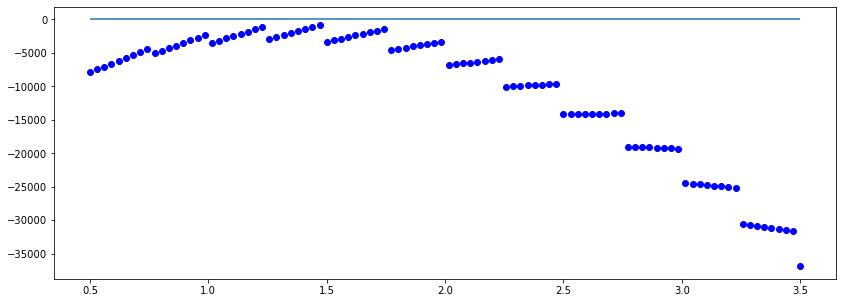

In [303]:
fig, ax1 = plt.subplots(figsize=(14,5))
plt.scatter(np.linspace(0.5, 3.5, 100), [b[-1]for b, l in blimdata], color='blue')
plt.hlines(0, 0.5, 3.5)
plt.show()

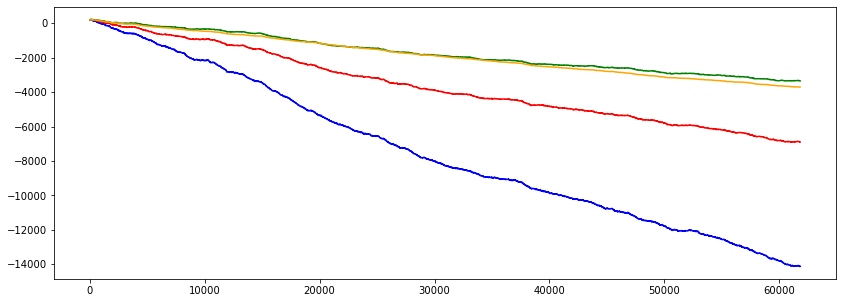

In [300]:
fig, ax1 = plt.subplots(figsize=(14,5))
plt.plot(b25, color='blue')
# plt.plot(b25_2, color='blue', linestyle='dashed')
plt.plot(b20, color='red')
# plt.plot(b20_2, color='red', linestyle='dashed')
plt.plot(b15, color='green')
# plt.plot(b15_2, color='green', linestyle='dashed')
plt.plot(b10, color='orange')
# plt.plot(b10_2, color='orange', linestyle='dashed')
plt.hlines(0, 0.5, 3.5)
plt.show()

In [305]:
blimdata_lag = []
for blim in tqdm.tqdm_notebook(np.linspace(0.5, 3.5, 100), desc='Action Lag'):
    blimdata_lag.append(ts2(ddf, blim, 'action_lag',1))
blimdata_pred = []
for blim in tqdm.tqdm_notebook(np.linspace(0.5, 3.5, 100), desc='Action Pred'):
    blimdata_pred.append(ts2(ddf, blim, 'action_pred',1))

/home/shmalex/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


Action Lag:   0%|          | 0/100 [00:00<?, ?it/s]

/home/shmalex/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


Action Pred:   0%|          | 0/100 [00:00<?, ?it/s]

In [202]:
len(ledger)

8721

In [264]:
?plt.hlines

In [311]:
?plt.scatter

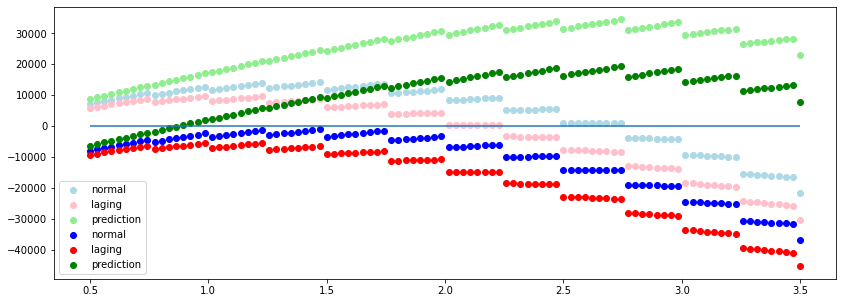

In [338]:
fig, ax1 = plt.subplots(figsize=(14,5))
plt.scatter(np.linspace(0.5, 3.5, 100), [b[-1]+8721*1.74 for b, l in blimdata], color='lightblue', label='normal')
plt.scatter(np.linspace(0.5, 3.5, 100), [b[-1]+8721*1.74 for b, l in blimdata_lag], color='pink', label='laging')
plt.scatter(np.linspace(0.5, 3.5, 100), [b[-1]+8721*1.74 for b, l in blimdata_pred], color='lightgreen', label='prediction')
plt.scatter(np.linspace(0.5, 3.5, 100), [b[-1]for b, l in blimdata], color='blue', label='normal')
plt.scatter(np.linspace(0.5, 3.5, 100), [b[-1]for b, l in blimdata_lag], color='red', label='laging')
plt.scatter(np.linspace(0.5, 3.5, 100), [b[-1]for b, l in blimdata_pred], color='green', label='prediction')
plt.hlines(0, 0.5, 3.5)
plt.legend()
plt.show()

In [443]:
!nvitop

Mon Nov 13 16:16:16 2023
╒═════════════════════════════════════════════════════════════════════════════╕
│ NVIDIA-SMI 525.85.12       Driver Version: 525.85.12       CUDA Version: 12.0     │
├───────────────────────────────┬──────────────────────┬──────────────────────┤
│ GPU  Name        Persistence-M│ Bus-Id        Disp.A │ Volatile Uncorr. ECC │
│ Fan  Temp  Perf  Pwr:Usage/Cap│         Memory-Usage │ GPU-Util  Compute M. │
╞═══════════════════════════════╪══════════════════════╪══════════════════════╡
│   0  NVIDIA GeForce ...  Off  │ 00000000:03:00.0  On │                  N/A │
│  0%   53C    P2   105W / 300W │   1713MiB / 11264MiB │     39%      Default │
╘═══════════════════════════════╧══════════════════════╧══════════════════════╛
[ CPU: ████▉ 16.3%                        ]  ( Load Average:  1.70  1.52  1.24 )
[ MEM: ████▉ 16.1%                        ]  [ SWP: ▏ 0.0%                     ]

╒══════════════════════════════════════════════════════════════════════════════╕
│ Pro

In [269]:
blim_argsort = np.argsort([b[-1]for b, l in blimdata])

In [274]:
?np.where

In [277]:
best_blimdata_idx = np.where(blim_argsort==0)[0][0]

blimdata_lag

print(best_blimdata_idx)

42

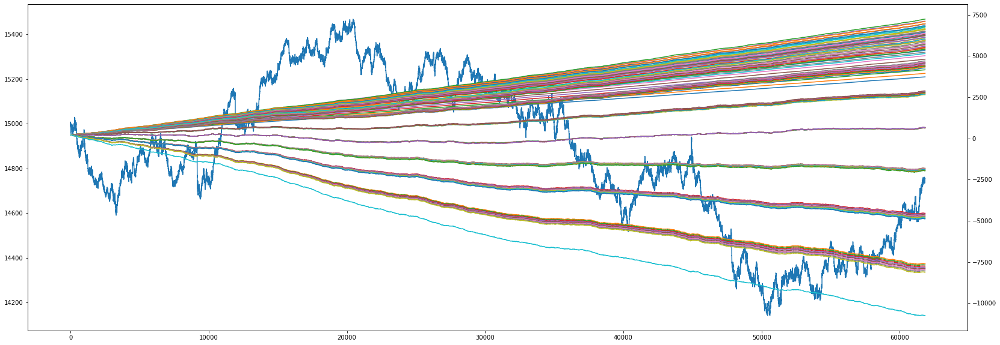

In [281]:
fig, ax1 = plt.subplots(figsize=(28,10))
I = 0
N = -1
ax1.plot( ddf.iloc[:N]['close'])
# ax1.plot(vals[I:I+N])
ax2 = ax1.twinx() 


for b, l in blimdata:
    ax2.plot(b[:N])
# ax2.plot(b20[:N], color='blue')
# ax2.plot(b15[:N], color='orange')
# ax2.plot(b10[:N], color='red')
# ax2.plot(np.array(actions[:N])*50+301, color='orange', alpha=0.5)
# ax2.plot(actions[:N], color='green')
# ax1.plot(vals[I:I+N])
# ax2.plot(ddf.iloc[:N]['ft'], color='orange')
plt.show()

In [209]:
#         ledger        .append([row[action_price], volume, action])
ldf25 = pd.DataFrame(l25, columns=['idx','open','close', 'pnl', 'action', 'openft'])
ldf20 = pd.DataFrame(l20, columns=['idx','open','close', 'pnl', 'action', 'openft'])
ldf15 = pd.DataFrame(l15, columns=['idx','open','close', 'pnl', 'action', 'openft'])
ldf10 = pd.DataFrame(l10, columns=['idx','open','close', 'pnl', 'action', 'openft'])

In [204]:
ldf['pnl'].describe()

count    8721.000000
mean        0.666495
std         1.343872
min        -1.500000
25%        -1.500000
50%         1.500000
75%         1.500000
max         1.500000
Name: pnl, dtype: float64

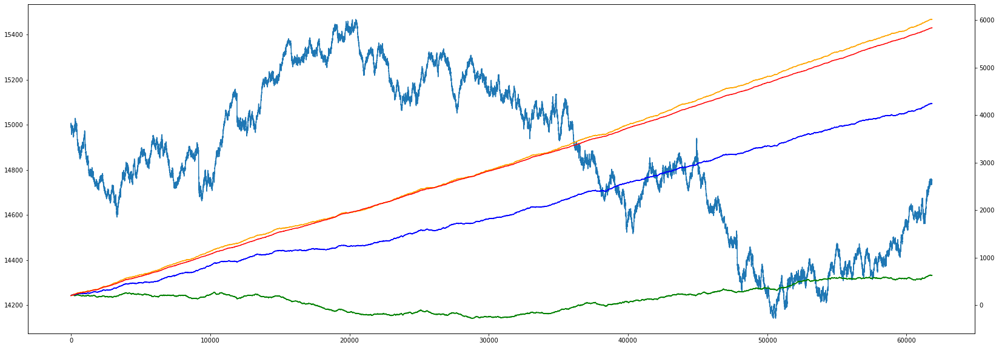

In [211]:
fig, ax1 = plt.subplots(figsize=(28,10))
I = 0
N = -1
ax1.plot( ddf.iloc[:N]['close'])
# ax1.plot(vals[I:I+N])
ax2 = ax1.twinx() 
ax2.plot(b25[:N], color='green')
ax2.plot(b20[:N], color='blue')
ax2.plot(b15[:N], color='orange')
ax2.plot(b10[:N], color='red')
# ax2.plot(np.array(actions[:N])*50+301, color='orange', alpha=0.5)
# ax2.plot(actions[:N], color='green')
# ax1.plot(vals[I:I+N])
# ax2.plot(ddf.iloc[:N]['ft'], color='orange')
plt.show()

In [195]:
pnl_charts(ldf, action)

KeyError: 'closeft'

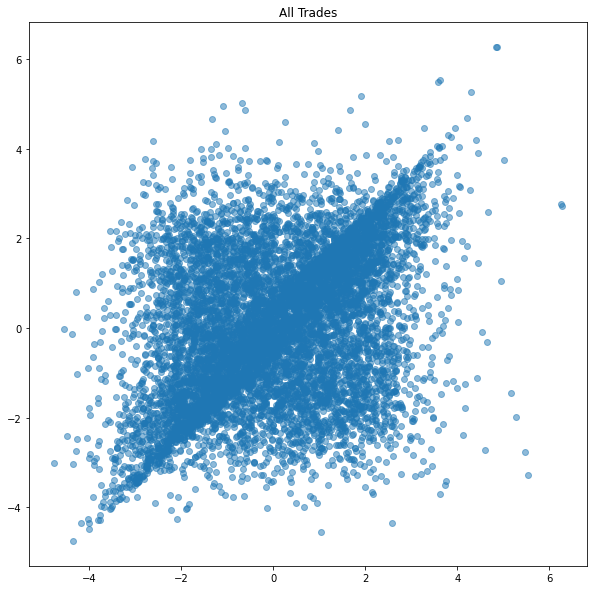

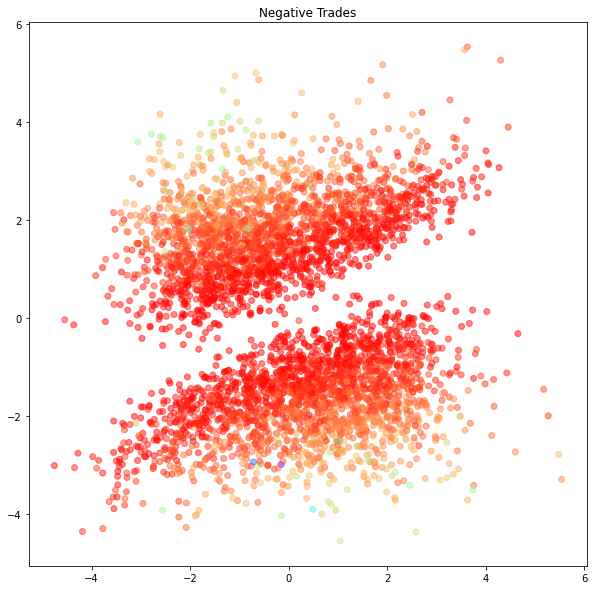

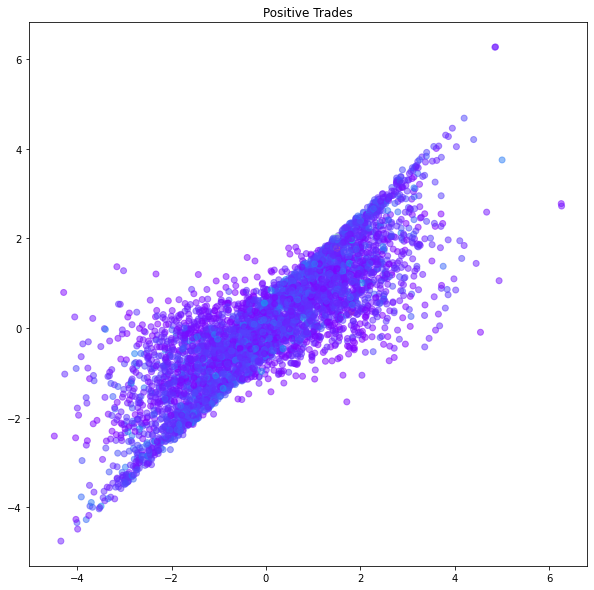

In [134]:
ldf_filter = np.abs(ldf['openft']) >= 0
sc_openft = ldf[ldf_filter]['openft']
sc_closeft = ldf[ldf_filter]['closeft']
sc_pnl = ldf[ldf_filter]['pnl']

plt.figure(figsize=(10,10))
plt.scatter(sc_openft, sc_closeft, alpha=0.5)#, c=sc_pnl, cmap=cm.rainbow)
plt.title('All Trades')
plt.show()

pnl_filter = sc_pnl < 0
plt.figure(figsize=(10,10))
plt.scatter(sc_openft[pnl_filter], sc_closeft[pnl_filter], alpha=0.5, c=sc_pnl[pnl_filter], cmap=cm.rainbow)
plt.title('Negative Trades')
plt.show()


pnl_filter = sc_pnl > 0
plt.figure(figsize=(10,10))
plt.scatter(sc_openft[pnl_filter], sc_closeft[pnl_filter], alpha=0.5, c=sc_pnl[pnl_filter], cmap=cm.rainbow)
plt.title('Positive Trades')
plt.show()

In [136]:
signal_freq_shifted

array([-8.86618172e-30-4.82652453e-14j, -1.90958360e-14+9.32417267e-15j,
       -7.83534364e-14-8.37123333e-14j,  7.37188088e-14-1.06305555e-13j,
        2.64365601e-14+3.14681475e-14j,  5.00000000e+02-2.22044605e-13j,
        7.88567905e-14+5.40280981e-15j,  2.87198943e-14-4.17363470e-15j,
        4.82336054e-14-1.41013360e-14j, -7.76780895e-15-2.76942596e-14j,
        7.05969442e-14+6.71840706e-15j,  3.80876410e-14+5.44594340e-14j,
       -1.17694896e-13-4.60291911e-14j,  1.31131481e-13-8.07752150e-14j,
        6.63599558e-14+4.85925332e-14j,  2.29335127e-14-1.71333410e-14j,
        2.26769432e-14+3.87504366e-14j,  1.02230559e-14+1.34439512e-14j,
        1.94331743e-14+3.11021070e-14j, -4.39533027e-14-5.63913791e-14j,
        7.40422678e-14+2.23842366e-14j,  3.61570443e-14+2.69680677e-14j,
       -4.52041869e-14+5.59704637e-15j,  1.86865539e-14+1.32253533e-14j,
       -1.85125754e-14+6.68832658e-15j,  1.33955439e-14+1.42044711e-14j,
       -2.61349229e-14-2.14138390e-14j,  5.26251815

# Temporary Code below

In [ ]:
# https://www.geeksforgeeks.org/how-to-create-a-candlestick-chart-in-matplotlib/
I = 0
N = 10

up = ddf[ddf.close >= ddf.open].iloc[I:I+N]
down = ddf[ddf.close < ddf.open].iloc[I:I+N]
col1 = 'blue'
col2 = 'green'

# Setting width of candlestick elements 
width = .7
width2 = .03

plt.figure(figsize=(14,5))
# Plotting up prices of the stock 
plt.bar(up.index, up.close-up.open, width,  bottom=up.open,  color=col1) 
plt.bar(up.index, up.high-up.close, width2, bottom=up.close, color=col1) 
plt.bar(up.index, up.low-up.open,   width2, bottom=up.open,  color=col1) 
  
# Plotting down prices of the stock 
plt.bar(down.index, down.close-down.open, width,  bottom=down.open,  color=col2) 
plt.bar(down.index, down.high-down.open,  width2, bottom=down.open,  color=col2) 
plt.bar(down.index, down.low-down.close,  width2, bottom=down.close, color=col2) 
  
# rotating the x-axis tick labels at 30degree  
# towards right 
# plt.xticks(rotation=30, ha='right') 
  
# displaying candlestick chart of stock data  
# of a week 
plt.show() 
